In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms

from utils import mnist, plot_graphs, plot_mnist
import numpy as np

%matplotlib inline

In [2]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

In [3]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


In [4]:
#train_loader, valid_loader, test_loader = mnist(valid=10000, transform=transforms.ToTensor())

mnist_tanh = transforms.Compose([
                transforms.ToTensor(),
                transforms.Normalize((0.5,), (0.5,)),
                lambda x: x.to(device)
           ])
train_loader, valid_loader, test_loader = mnist(valid=10000, transform=mnist_tanh)

In [5]:
def get_random_h():
    z = torch.randn((50, 10))     
    return z

In [6]:
train_epoch = 200
batch_size = 50
test_reveal_period = 20
batch_zeros = torch.zeros((batch_size, 1)).to(device)
batch_ones = torch.ones((batch_size, 1)).to(device)

In [7]:
fixed_data, _ = next(iter(test_loader))
fixed_data = fixed_data.to(device)
fixed_h = get_random_h().to(device)

In [8]:
class ConvLayer(nn.Module):
    def __init__(self, size, padding=1, pool_layer=nn.MaxPool2d(2, stride=2),
                 bn=False, dropout=False, activation_fn=nn.LeakyReLU(0.1), stride=1, device='cpu'):
        super(ConvLayer, self).__init__()
        layers = []
        layers.append(nn.Conv2d(size[0], size[1], size[2], padding=padding, stride=stride))
        if pool_layer is not None:
            layers.append(pool_layer)
        if bn:
            layers.append(nn.BatchNorm2d(size[1]))
        if dropout:
            layers.append(nn.Dropout2d())
        layers.append(activation_fn)
        
        self.model = nn.Sequential(*layers)
        self.to(device)
    
    def forward(self, x):
        return self.model(x)

In [9]:
class DeconvLayer(nn.Module):
    def __init__(self, size, padding=1, stride=1, 
                 bn=False, dropout=False, activation_fn=nn.LeakyReLU(0.1), output_padding=0, device='cpu'):
        super(DeconvLayer, self).__init__()
        layers = []
        layers.append(nn.ConvTranspose2d(size[0], size[1], size[2], padding=padding, 
                                         stride=stride, output_padding=output_padding))
        if bn:
            layers.append(nn.BatchNorm2d(size[1]))
        if dropout:
            layers.append(nn.Dropout2d())
        layers.append(activation_fn)
        
        self.model = nn.Sequential(*layers)
        self.to(device)
    
    def forward(self, x):
        return self.model(x)

In [10]:
class FullyConnected(nn.Module):
    def __init__(self, sizes, dropout=False, activation_fn=nn.Tanh(), flatten=False, last_fn=None, device='cpu'):
        super(FullyConnected, self).__init__()
        layers = []
        self.flatten = flatten
        for i in range(len(sizes) - 2):
            layers.append(nn.Linear(sizes[i], sizes[i+1]))
            if dropout:
                layers.append(nn.Dropout(dropout))
            layers.append(activation_fn) # нам не нужен дропаут и фнкция активации в последнем слое
        else: 
            layers.append(nn.Linear(sizes[-2], sizes[-1]))
        if last_fn is not None:
            layers.append(last_fn)
        self.model = nn.Sequential(*layers)
        self.to(device)
        
    def forward(self, x):
        if self.flatten:
            x = x.view(x.shape[0], -1)
        return self.model(x)

In [11]:
class Net(nn.Module):
    def __init__(self, batchnorm=False, dropout=False, optim_type='SGD', device='cpu', **optim_params):
        super(Net, self).__init__()
        
        self.latent_size = 10
        
        self._conv1 = ConvLayer([1, 16, 4], padding=0, bn=batchnorm, dropout=dropout, stride=2, pool_layer=None, device=device)
        self._conv2 = ConvLayer([16, 32, 4], padding=0, bn=batchnorm, dropout=dropout, stride=2, pool_layer=None, device=device)
        self._conv3 = ConvLayer([32, 32, 3], padding=0, bn=batchnorm, dropout=dropout, stride=2, pool_layer=None, device=device)
        
        self.latent_fn = nn.Sigmoid()
                    
        self.fce = FullyConnected([32*2*2, self.latent_size])
        self.fcd = FullyConnected([self.latent_size, 32*2*2])
        
        self._deconv1 = DeconvLayer([32, 32, 3], stride=2, padding=0, bn=batchnorm, device=device)
        self._deconv2 = DeconvLayer([32, 16, 4], stride=2, padding=0, bn=batchnorm, output_padding=1, device=device)
        self._deconv3 = DeconvLayer([16, 1, 4], stride=2, padding=0, bn=batchnorm, activation_fn=nn.Tanh(), device=device)
    
        if optim_type == 'SGD':
            self.optim = optim.SGD(self.parameters(), **optim_params)
        elif optim_type == 'Adadelta':
            self.optim = optim.Adadelta(self.parameters(), **optim_params)
        elif optim_type == 'RMSProp':
            self.optim = optim.RMSprop(self.parameters(), **optim_params)
        elif optim_type == 'Adam':
            self.optim = optim.Adam(self.parameters(), **optim_params)
                    
        self.discr = FullyConnected([self.latent_size, 256, 256, 1], dropout=0.3, activation_fn=nn.LeakyReLU(0.2), flatten=True, device=device)       
        self.d_optimizer = optim.Adam(self.discr.parameters(), **optim_params)
        
        self.to(device)
        
       
    def conv(self, x):
        l1 = self._conv1(x)
        l2 = self._conv2(l1)
        l3 = self._conv3(l2)
        return l3, l2, l1
    
    def encode(self, x):
        l3 = self.conv(x)[0]
        flatten = l3.view(-1, 32*2*2)
        h = self.latent_fn(self.fce(flatten))
        return h
    
    def decode(self, h):
        flatten = self.fcd(h)
        l1 = flatten.view(-1, 32, 2, 2)
        l2 = self._deconv1(l1)
        l3 = self._deconv2(l2)
        x = self._deconv3(l3)
        return x
    
    def discriminator(self, x):        
        x = self.discr(x)       
        return x
                
    def forward(self, x):
        self.h = self.encode(x)
        x = self.decode(self.h)
        return x
    
    def ae_loss(self, data):
                       
        output = self.forward(data)     
        self._reconst_loss = F.mse_loss(output, data) 
        
        encoded = self.encode(data) 
        fake_pred = self.discriminator(encoded) 
        self._discr_loss = 0.1 * F.binary_cross_entropy_with_logits(fake_pred, batch_ones)        
        
        self._ae_loss = self._reconst_loss + self._discr_loss
                        
        return self._ae_loss
    
    def ds_loss(self, data):
                       
        encoded = self.encode(data)           
        fake_pred = self.discriminator(encoded)
        true_pred = self.discriminator(get_random_h().to(device))

        fake_loss = F.binary_cross_entropy_with_logits(fake_pred, batch_zeros)
        true_loss = F.binary_cross_entropy_with_logits(true_pred, batch_ones) 
        self._ds_loss = 0.5*(fake_loss + true_loss)
        
        return self._ds_loss

In [12]:
models = {
    'Adam Discr+bn': Net(True, False, optim_type='Adam', lr=1e-4, device=device),
    'Adam Discr+dp': Net(False, True, optim_type='Adam', lr=1e-4, device=device),
    'Adam Discr+bn+dp': Net(True, True, optim_type='Adam', lr=1e-4, device=device),
}
train_log = {k: [] for k in models}
test_log = {k: [] for k in models}

In [13]:
def train(epoch, models, log=None):
    train_size = len(train_loader.sampler)
    for batch_idx, (data, _) in enumerate(train_loader):
        data = data.to(device)
        for model in models.values():
            
            # train discriminator
            model.optim.zero_grad()
            model.d_optimizer.zero_grad()
                     
            ds_loss = model.ds_loss(data)        
            ds_loss.backward()
            model.d_optimizer.step()
                        
            # train AE
            model.optim.zero_grad()
            model.d_optimizer.zero_grad()
                      
            ae_loss = model.ae_loss(data)            
            ae_loss.backward()
            model.optim.step()
                       
            
        if batch_idx % 500 == 0:
            line = 'Train Epoch: {} [{}/{} ({:.0f}%)]\tLosses '.format(
                epoch, batch_idx * len(data), train_size, 100. * batch_idx / len(train_loader))
            losses = ' '.join(['{}: AE:{:.4f} D:{:.4f}'.format(k, m._ae_loss.item(), m._ds_loss.item()) for k, m in models.items()])
            print(line + losses)
            
    else:
        batch_idx += 1
        line = 'Train Epoch: {} [{}/{} ({:.0f}%)]\tLosses '.format(
            epoch, batch_idx * len(data), train_size, 100. * batch_idx / len(train_loader))
        losses = ' '.join(['{}: AE:{:.4f} D:{:.4f}'.format(k, m._ae_loss.item(), m._ds_loss.item()) for k, m in models.items()])
        if log is not None:
            for k in models:
                log[k].append((models[k]._ae_loss, models[k]._ds_loss))
        print(line + losses)

In [14]:
def plot_latent(images, shape):
    fig = plt.figure(figsize=shape[::-1], dpi=80)
    for j in range(1, len(images) + 1):
        ax = fig.add_subplot(shape[0], shape[1], j)
        ax.matshow(images[j - 1, 0, :, :], cmap = matplotlib.cm.binary)
        plt.xticks(np.array([]))
        plt.yticks(np.array([]))

    plt.show()
    

In [15]:
def test(models, loader, epoch, period, log=None):
    test_size = len(loader)
    test_rc_loss = {k: 0. for k in models}
    test_ds_loss = {k: 0. for k in models}
    test_discr_loss = {k: 0. for k in models}
    with torch.no_grad():
        for batch_idx, (data, _) in enumerate(train_loader):
            output = {k: m.forward(data) for k, m in models.items()}
            for k, m in models.items():                
                m.ae_loss(data)
                test_rc_loss[k] += m._reconst_loss
                test_discr_loss[k] += m._discr_loss
                test_ds_loss[k] += m.ds_loss(data).item() 
    
    for k in models:
        test_rc_loss[k] /= test_size
        test_discr_loss[k] /= test_size 
        test_ds_loss[k] /= test_size 
    report = 'Test losses: \n' + ''.join(['{}: {:.8f} / {:.8f} / {:.8f} \n'.format(k, test_rc_loss[k], 
                                         test_discr_loss[k], test_ds_loss[k]) 
                                         for k in models])
    if log is not None:
        for k in models:
            log[k].append((test_rc_loss[k], test_discr_loss[k], test_ds_loss[k],))
            if epoch % period == 0:
                with torch.no_grad():
                    print ("Model {}:".format(k))
                    ae_data = models[k].forward(fixed_data).cpu().data.numpy()
                    fixed_gen = models[k].decode(fixed_h).cpu().data.numpy()
                    random_gen = models[k].decode(get_random_h().to(device)).cpu().data.numpy()
                    plot_mnist(ae_data, (5, 10))
                    plot_mnist(fixed_gen, (5, 10)) 
                    plot_mnist(random_gen, (5, 10)) 

                    encoded = model.encode(fixed_data[:10])
                    enc_to_lot = encoded.view(-1, 1, 2, 5).clamp(0, 1).cpu().data.numpy()
                    plot_latent(enc_to_lot, (1, 10))
            
    print(report)

Train Epoch: 1 [0/50000 (0%)]	Losses Adam Discr+bn: AE:0.9963 D:0.7125 Adam Discr+dp: AE:0.9208 D:0.6929 Adam Discr+bn+dp: AE:1.0387 D:0.7184
Train Epoch: 1 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:1.1076 D:0.0316 Adam Discr+dp: AE:0.7122 D:0.1368 Adam Discr+bn+dp: AE:1.0247 D:0.0426
Train Epoch: 1 [50000/50000 (100%)]	Losses Adam Discr+bn: AE:1.1377 D:0.0068 Adam Discr+dp: AE:0.7162 D:0.1709 Adam Discr+bn+dp: AE:1.0715 D:0.0121
Test losses: 
Adam Discr+bn: 3.41660333 / 2.36243129 / 0.03581805 
Adam Discr+dp: 1.82009745 / 1.69570220 / 0.39979290 
Adam Discr+bn+dp: 3.09549665 / 2.27105308 / 0.05527813 

Train Epoch: 2 [0/50000 (0%)]	Losses Adam Discr+bn: AE:1.1543 D:0.0087 Adam Discr+dp: AE:0.6664 D:0.1206 Adam Discr+bn+dp: AE:1.0858 D:0.0105
Train Epoch: 2 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:1.1740 D:0.0039 Adam Discr+dp: AE:0.7356 D:0.0520 Adam Discr+bn+dp: AE:1.0985 D:0.0263
Train Epoch: 2 [50000/50000 (100%)]	Losses Adam Discr+bn: AE:1.1308 D:0.0164 Adam Discr+dp: AE:0.

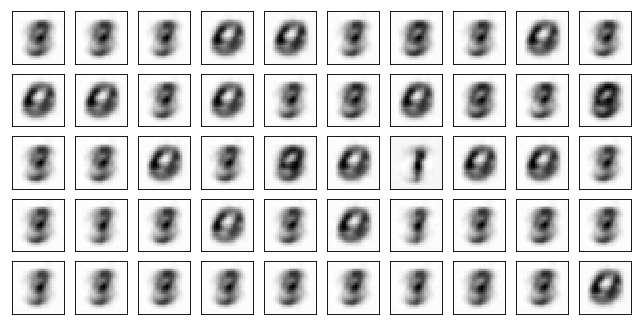

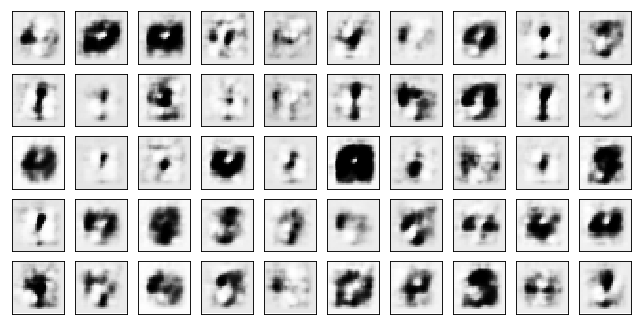

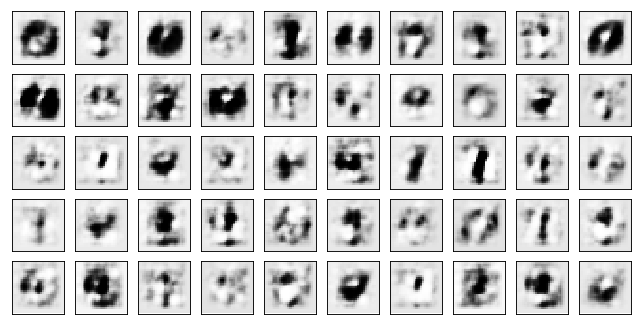

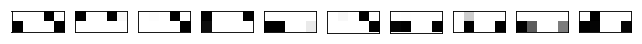

Model Adam Discr+dp:


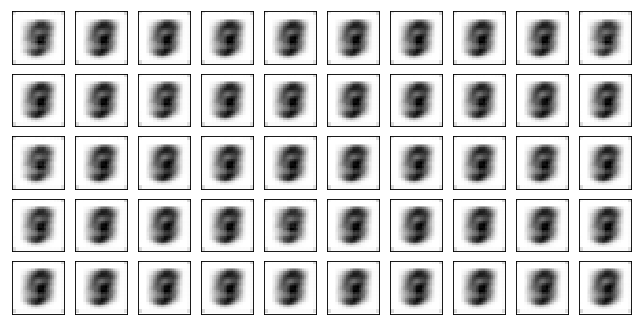

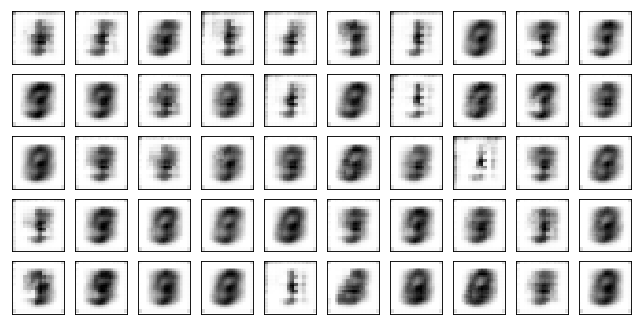

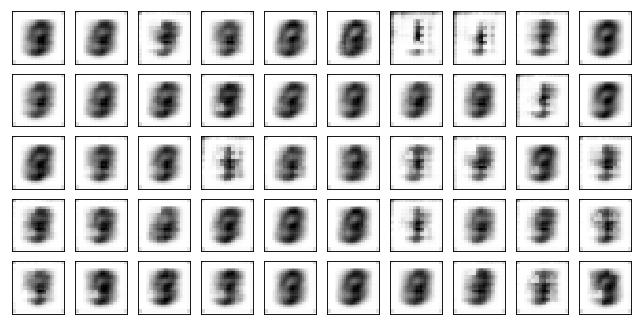

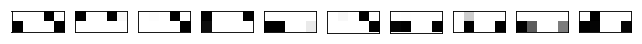

Model Adam Discr+bn+dp:


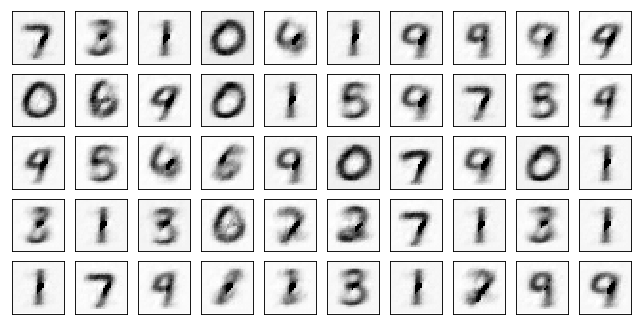

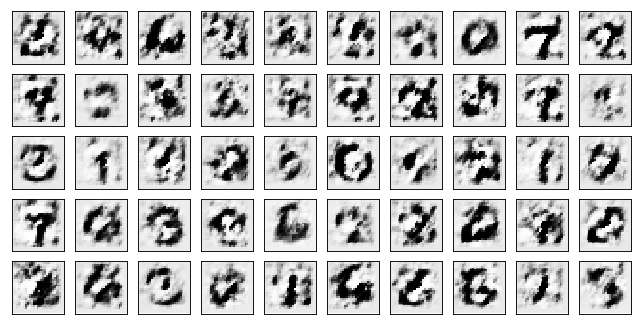

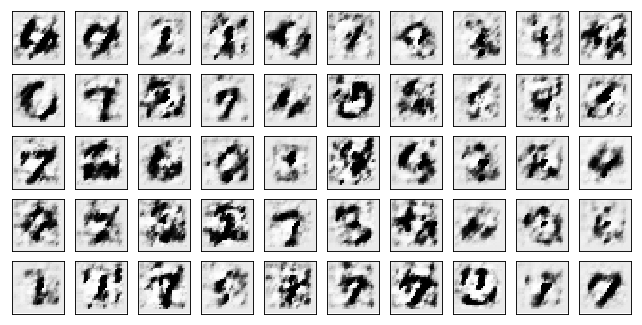

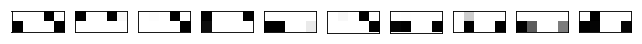

Test losses: 
Adam Discr+bn: 1.38395107 / 3.76796865 / 0.02151826 
Adam Discr+dp: 1.35119081 / 2.64944696 / 0.14542696 
Adam Discr+bn+dp: 1.07453430 / 3.97789574 / 0.01796283 

Train Epoch: 11 [0/50000 (0%)]	Losses Adam Discr+bn: AE:1.0070 D:0.0016 Adam Discr+dp: AE:0.7210 D:0.0202 Adam Discr+bn+dp: AE:0.9493 D:0.0012
Train Epoch: 11 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:1.0452 D:0.0013 Adam Discr+dp: AE:0.7430 D:0.0710 Adam Discr+bn+dp: AE:0.9799 D:0.0008
Train Epoch: 11 [50000/50000 (100%)]	Losses Adam Discr+bn: AE:1.0454 D:0.0042 Adam Discr+dp: AE:0.7343 D:0.0155 Adam Discr+bn+dp: AE:1.0194 D:0.0030
Test losses: 
Adam Discr+bn: 1.34687650 / 4.00902319 / 0.02005073 
Adam Discr+dp: 1.35843337 / 2.76743555 / 0.15592978 
Adam Discr+bn+dp: 1.03058600 / 4.12737370 / 0.02007135 

Train Epoch: 12 [0/50000 (0%)]	Losses Adam Discr+bn: AE:1.0142 D:0.0019 Adam Discr+dp: AE:0.7598 D:0.0786 Adam Discr+bn+dp: AE:0.9807 D:0.0029
Train Epoch: 12 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:0.

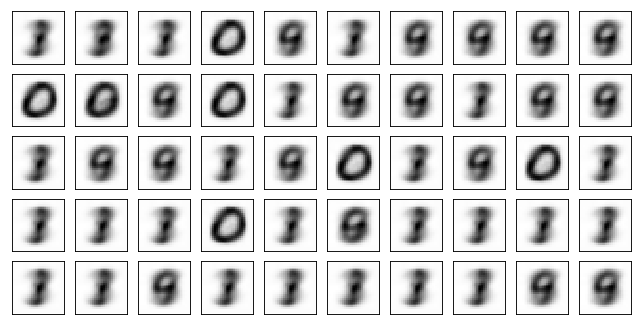

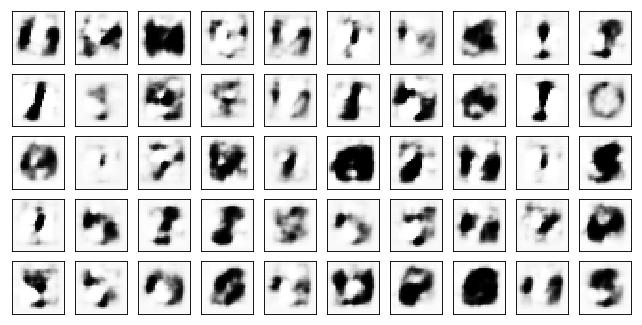

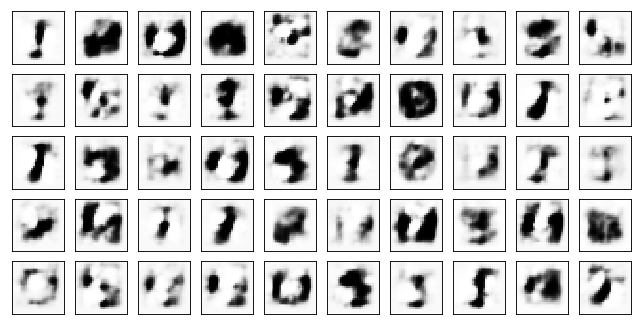

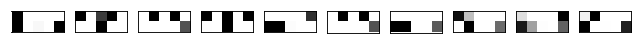

Model Adam Discr+dp:


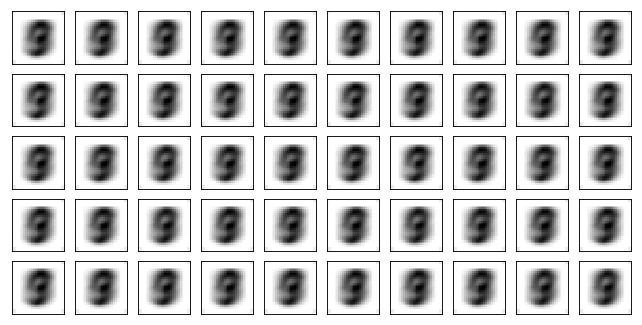

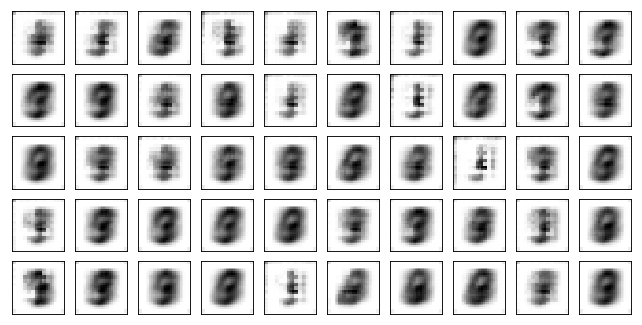

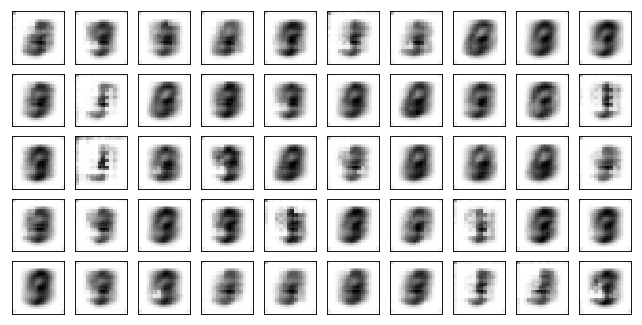

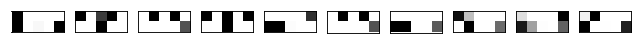

Model Adam Discr+bn+dp:


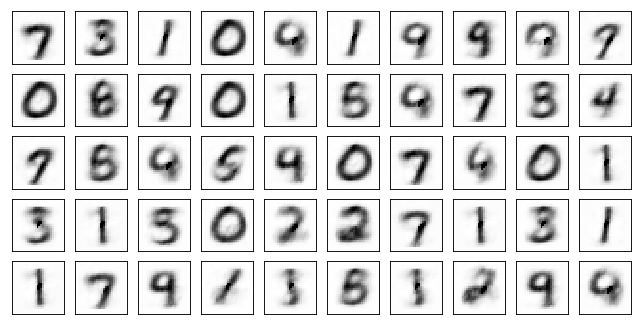

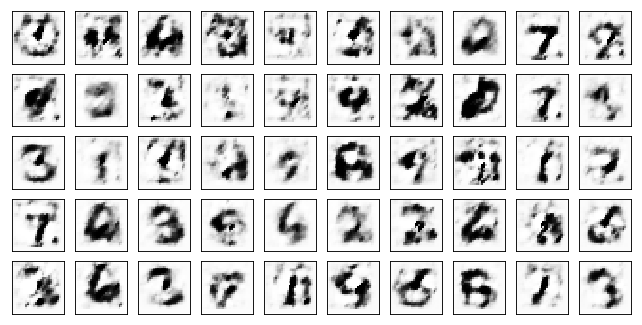

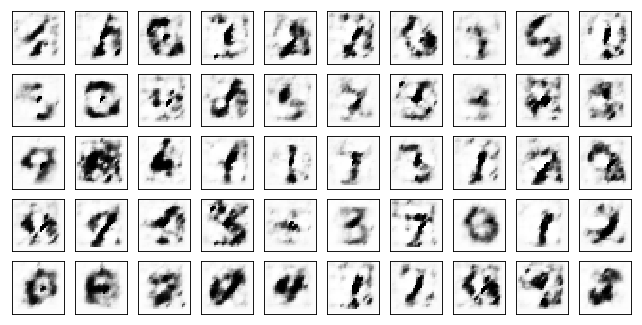

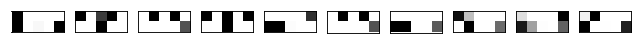

Test losses: 
Adam Discr+bn: 1.22048736 / 4.55371428 / 0.00136677 
Adam Discr+dp: 1.34347153 / 2.74218655 / 0.12466295 
Adam Discr+bn+dp: 0.90599906 / 3.42484283 / 0.03651525 

Train Epoch: 21 [0/50000 (0%)]	Losses Adam Discr+bn: AE:1.1184 D:0.0001 Adam Discr+dp: AE:0.7393 D:0.0085 Adam Discr+bn+dp: AE:0.8659 D:0.0164
Train Epoch: 21 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:1.0516 D:0.0011 Adam Discr+dp: AE:0.8052 D:0.0680 Adam Discr+bn+dp: AE:0.9120 D:0.0028
Train Epoch: 21 [50000/50000 (100%)]	Losses Adam Discr+bn: AE:1.1450 D:0.0010 Adam Discr+dp: AE:0.7791 D:0.0738 Adam Discr+bn+dp: AE:0.9303 D:0.0401
Test losses: 
Adam Discr+bn: 1.23353577 / 4.61277342 / 0.00296227 
Adam Discr+dp: 1.33667397 / 2.10643888 / 0.16518434 
Adam Discr+bn+dp: 0.90919125 / 3.57262349 / 0.04746203 

Train Epoch: 22 [0/50000 (0%)]	Losses Adam Discr+bn: AE:1.1185 D:0.0002 Adam Discr+dp: AE:0.7630 D:0.0133 Adam Discr+bn+dp: AE:0.8868 D:0.0025
Train Epoch: 22 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:1.

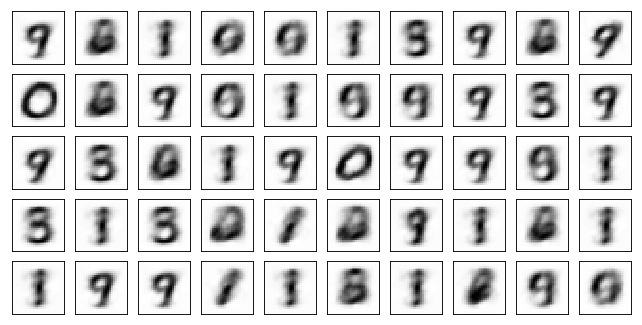

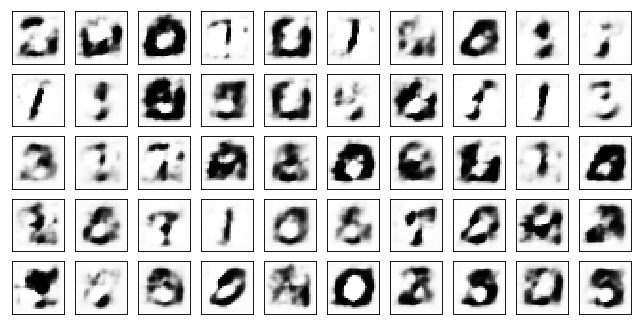

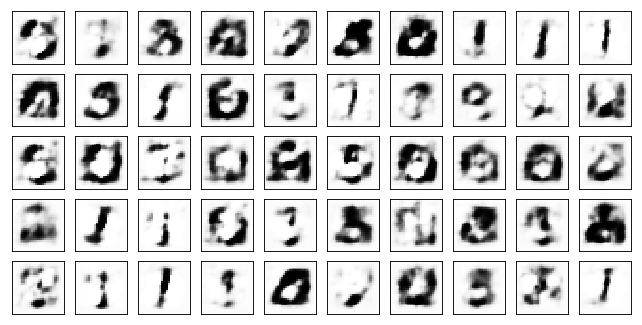

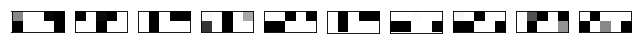

Model Adam Discr+dp:


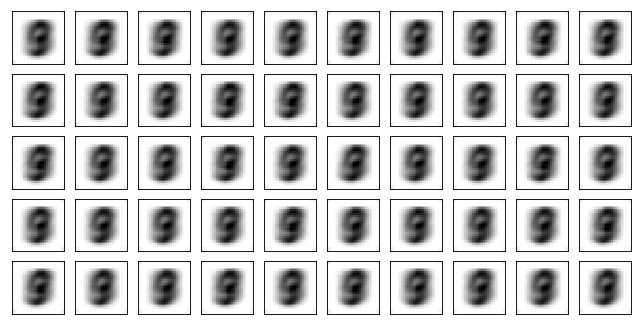

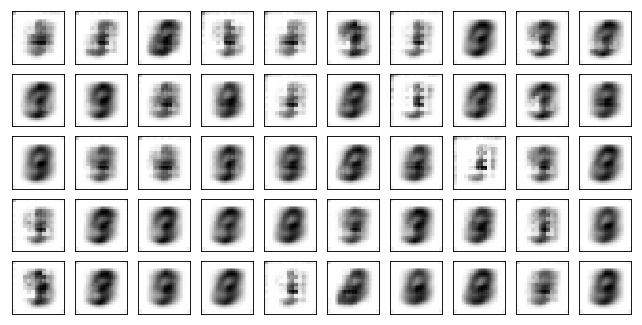

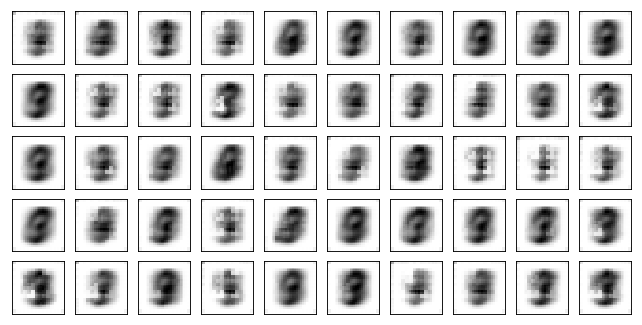

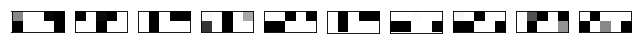

Model Adam Discr+bn+dp:


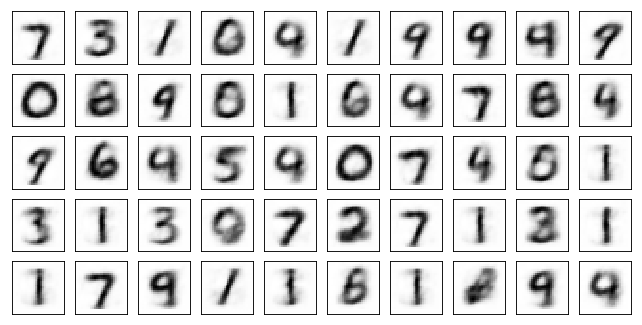

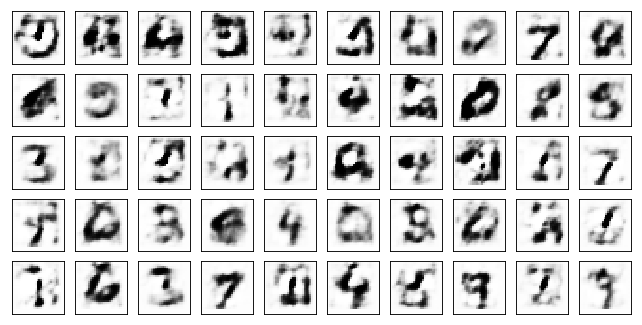

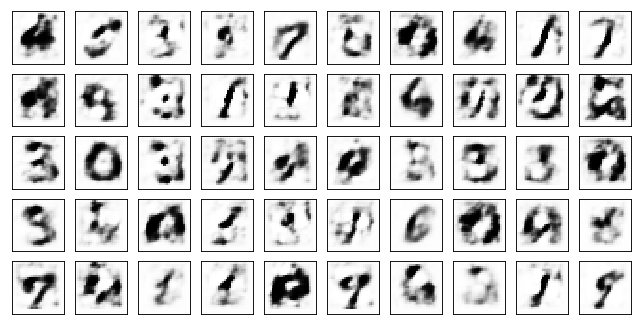

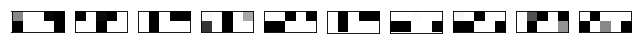

Test losses: 
Adam Discr+bn: 1.07864940 / 4.01521730 / 0.01984223 
Adam Discr+dp: 1.33640790 / 2.52339101 / 0.12402271 
Adam Discr+bn+dp: 0.86163861 / 3.36143947 / 0.04116162 

Train Epoch: 31 [0/50000 (0%)]	Losses Adam Discr+bn: AE:1.0326 D:0.0011 Adam Discr+dp: AE:0.8184 D:0.0170 Adam Discr+bn+dp: AE:0.8251 D:0.0045
Train Epoch: 31 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:0.9384 D:0.0035 Adam Discr+dp: AE:0.7359 D:0.0080 Adam Discr+bn+dp: AE:0.8609 D:0.0015
Train Epoch: 31 [50000/50000 (100%)]	Losses Adam Discr+bn: AE:0.9088 D:0.0015 Adam Discr+dp: AE:0.7898 D:0.0250 Adam Discr+bn+dp: AE:0.8342 D:0.0039
Test losses: 
Adam Discr+bn: 1.04721951 / 3.74947524 / 0.01587581 
Adam Discr+dp: 1.33180261 / 2.62656927 / 0.12873452 
Adam Discr+bn+dp: 0.85066581 / 3.36684990 / 0.04019442 

Train Epoch: 32 [0/50000 (0%)]	Losses Adam Discr+bn: AE:0.9063 D:0.0016 Adam Discr+dp: AE:0.7875 D:0.0094 Adam Discr+bn+dp: AE:0.8497 D:0.0020
Train Epoch: 32 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:0.

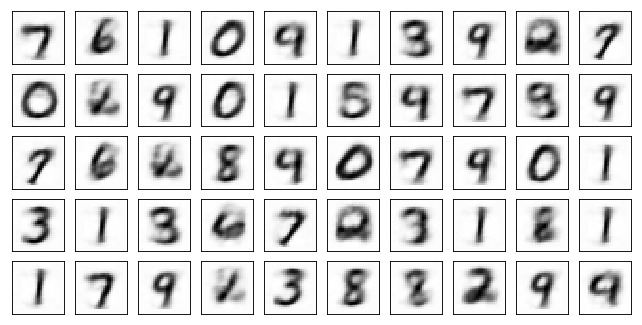

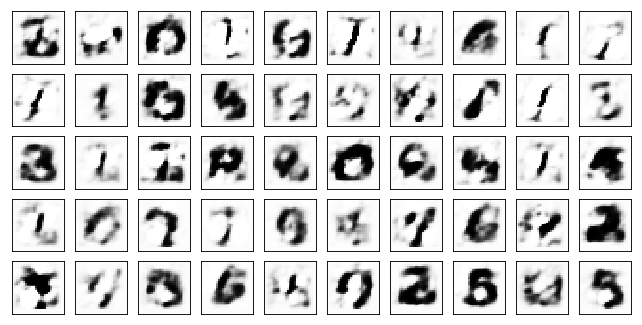

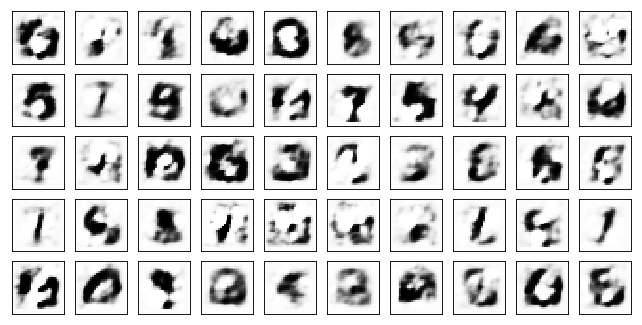

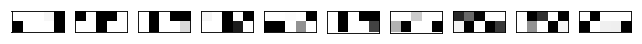

Model Adam Discr+dp:


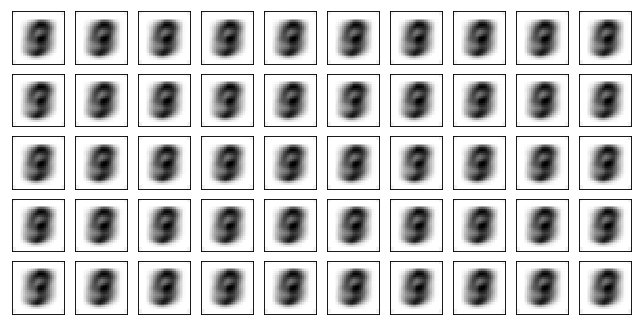

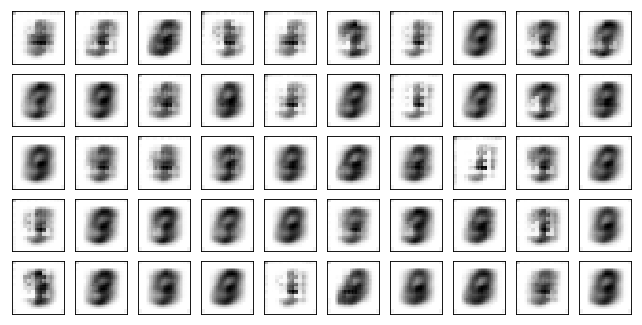

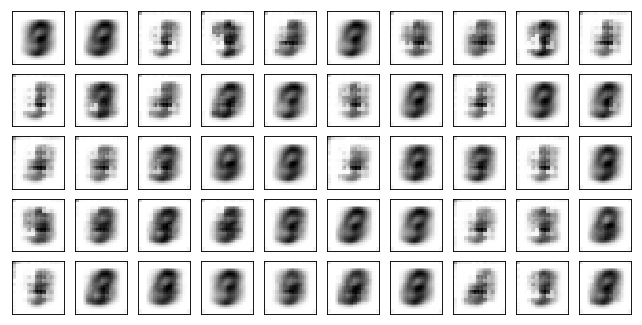

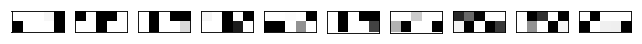

Model Adam Discr+bn+dp:


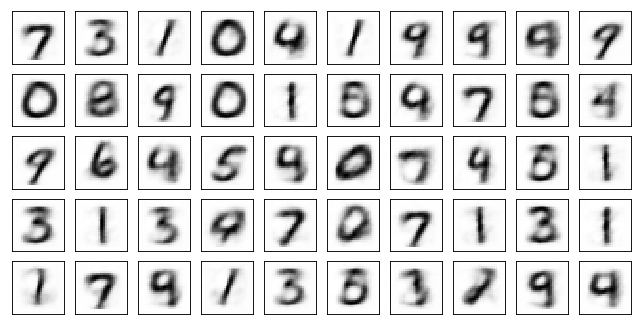

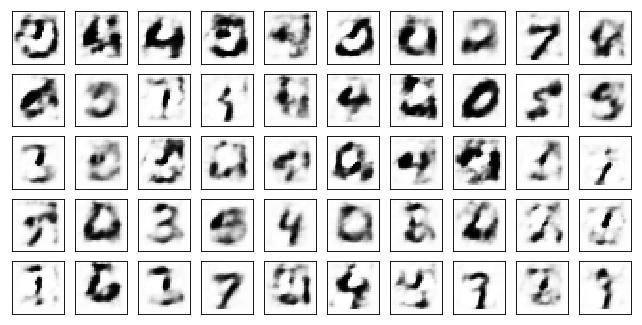

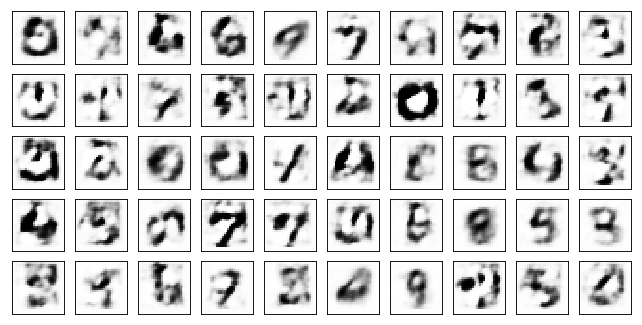

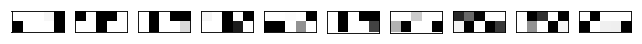

Test losses: 
Adam Discr+bn: 0.91677201 / 4.02959538 / 0.01368853 
Adam Discr+dp: 1.34050059 / 2.54912519 / 0.11510021 
Adam Discr+bn+dp: 0.81950432 / 2.93765211 / 0.11254440 

Train Epoch: 41 [0/50000 (0%)]	Losses Adam Discr+bn: AE:0.9477 D:0.0003 Adam Discr+dp: AE:0.8210 D:0.0035 Adam Discr+bn+dp: AE:0.7405 D:0.0593
Train Epoch: 41 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:0.9397 D:0.0006 Adam Discr+dp: AE:0.8068 D:0.0874 Adam Discr+bn+dp: AE:0.7113 D:0.0097
Train Epoch: 41 [50000/50000 (100%)]	Losses Adam Discr+bn: AE:0.9550 D:0.0019 Adam Discr+dp: AE:0.7897 D:0.0582 Adam Discr+bn+dp: AE:0.7532 D:0.0046
Test losses: 
Adam Discr+bn: 0.93533343 / 4.07570314 / 0.01303611 
Adam Discr+dp: 1.34144092 / 2.89716005 / 0.09847253 
Adam Discr+bn+dp: 0.81793600 / 2.92660475 / 0.11557092 

Train Epoch: 42 [0/50000 (0%)]	Losses Adam Discr+bn: AE:0.9835 D:0.0011 Adam Discr+dp: AE:0.7959 D:0.0046 Adam Discr+bn+dp: AE:0.7685 D:0.0522
Train Epoch: 42 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:0.

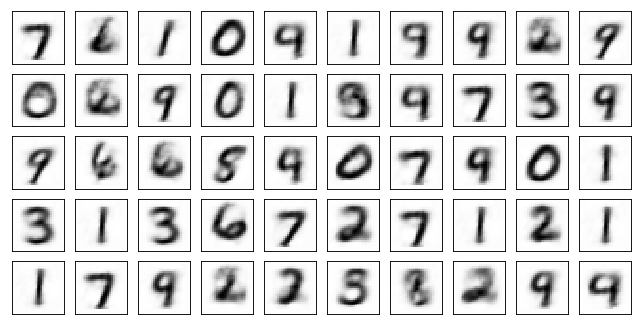

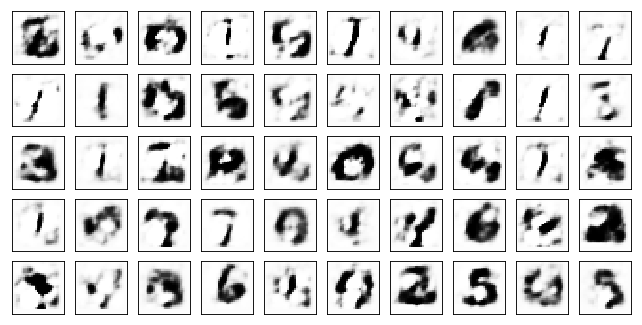

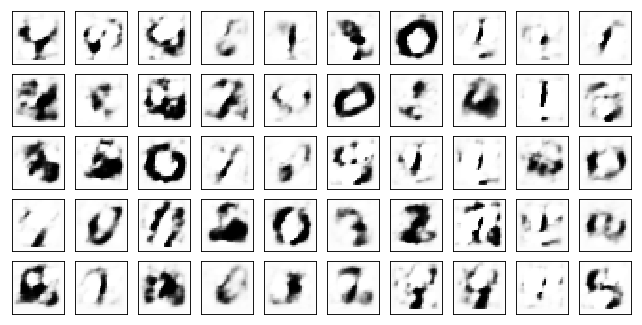

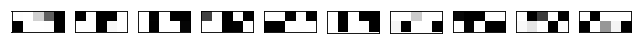

Model Adam Discr+dp:


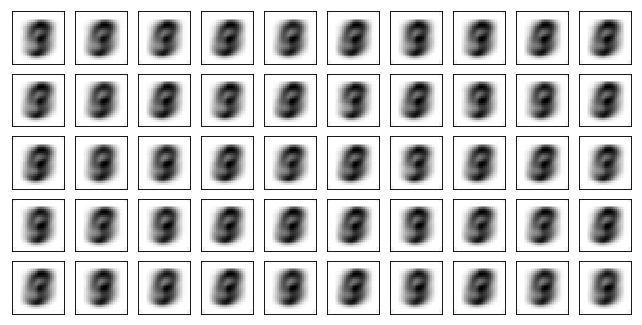

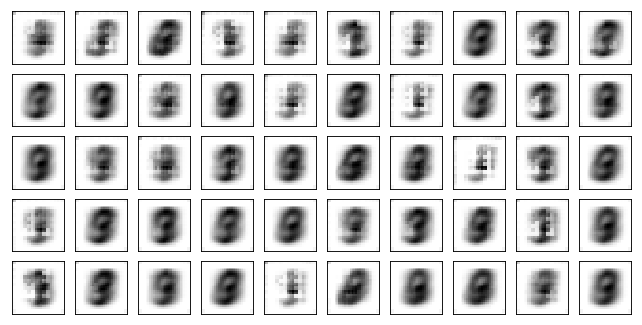

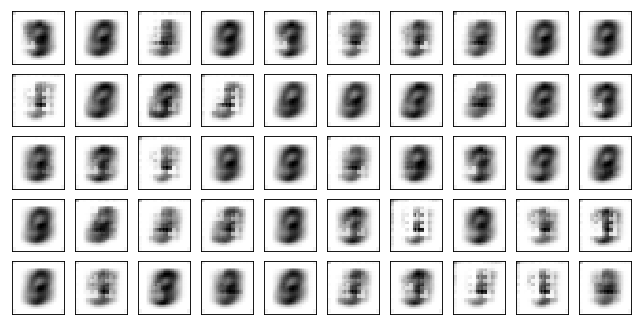

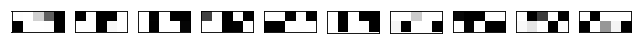

Model Adam Discr+bn+dp:


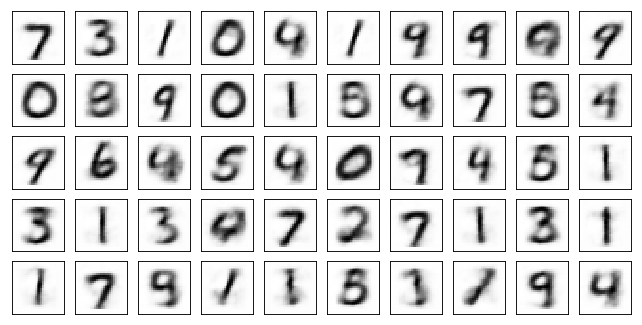

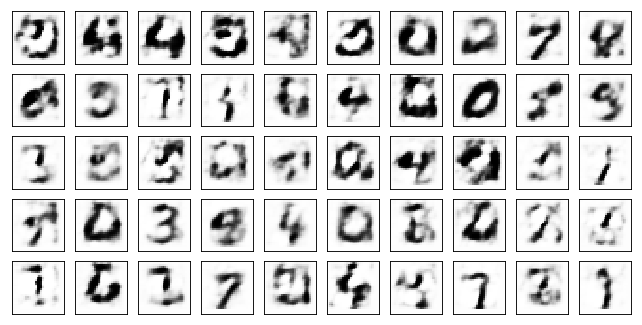

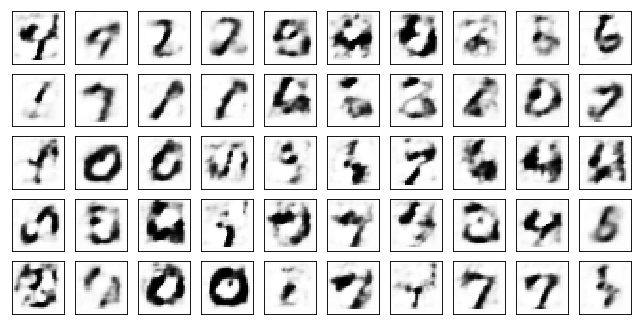

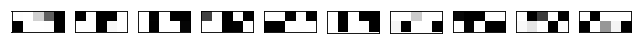

Test losses: 
Adam Discr+bn: 0.87505698 / 4.25202799 / 0.00703105 
Adam Discr+dp: 1.32436585 / 2.76946926 / 0.07794049 
Adam Discr+bn+dp: 0.80337751 / 2.79971886 / 0.09925106 

Train Epoch: 51 [0/50000 (0%)]	Losses Adam Discr+bn: AE:1.0051 D:0.0022 Adam Discr+dp: AE:0.7658 D:0.0065 Adam Discr+bn+dp: AE:0.7155 D:0.1176
Train Epoch: 51 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:0.9706 D:0.0004 Adam Discr+dp: AE:0.8099 D:0.0066 Adam Discr+bn+dp: AE:0.7312 D:0.0402
Train Epoch: 51 [50000/50000 (100%)]	Losses Adam Discr+bn: AE:0.9471 D:0.0003 Adam Discr+dp: AE:0.7914 D:0.0047 Adam Discr+bn+dp: AE:0.7014 D:0.0614
Test losses: 
Adam Discr+bn: 0.86290288 / 4.25215435 / 0.00687268 
Adam Discr+dp: 1.33725965 / 2.78224063 / 0.08899581 
Adam Discr+bn+dp: 0.80432522 / 2.79269505 / 0.09309404 

Train Epoch: 52 [0/50000 (0%)]	Losses Adam Discr+bn: AE:0.9690 D:0.0005 Adam Discr+dp: AE:0.7913 D:0.0045 Adam Discr+bn+dp: AE:0.7302 D:0.0372
Train Epoch: 52 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:1.

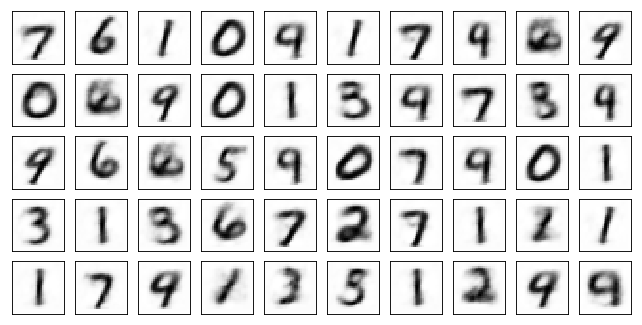

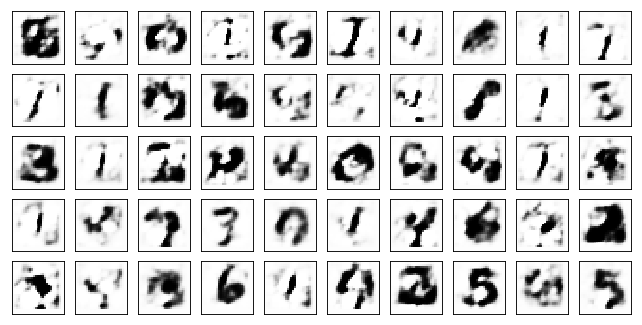

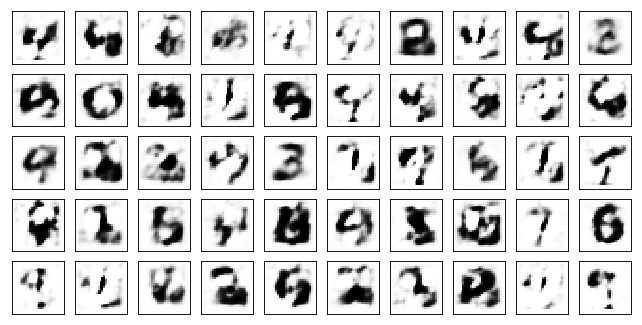

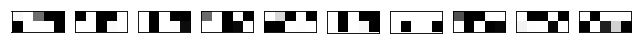

Model Adam Discr+dp:


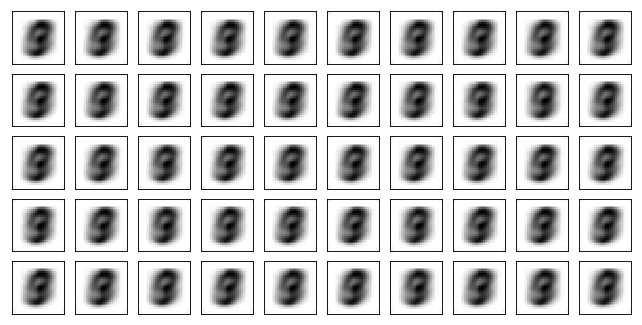

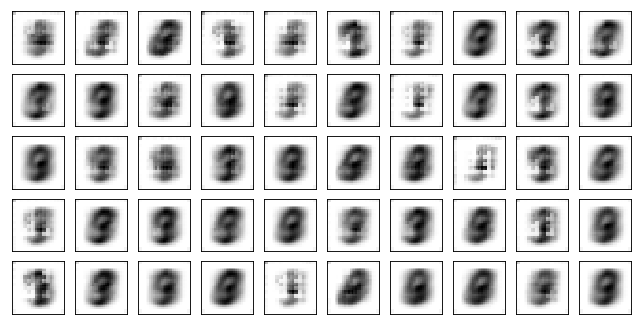

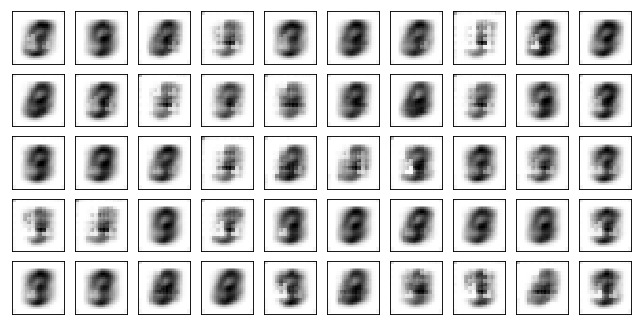

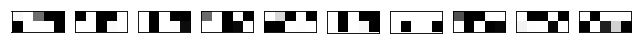

Model Adam Discr+bn+dp:


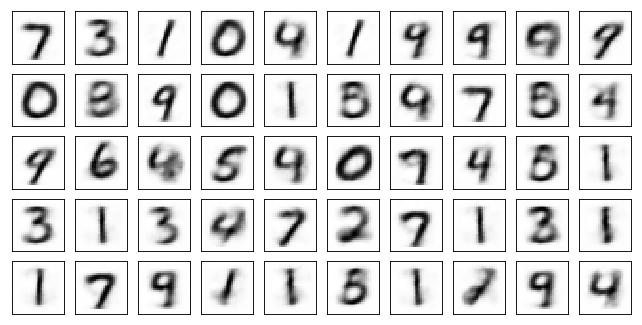

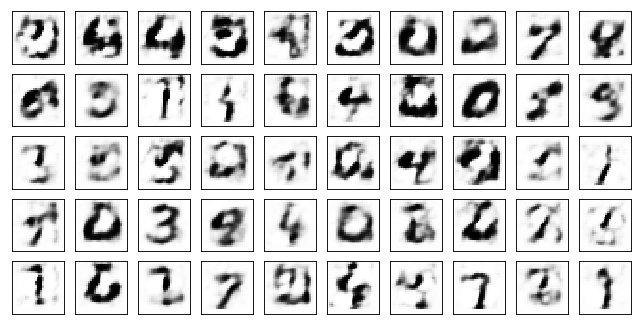

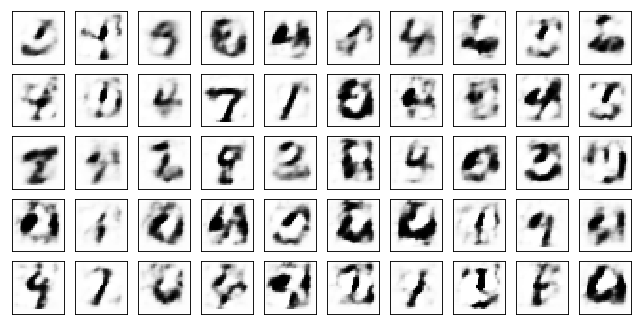

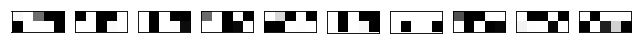

Test losses: 
Adam Discr+bn: 0.82045752 / 4.25662518 / 0.00448170 
Adam Discr+dp: 1.33997202 / 2.93825674 / 0.07060647 
Adam Discr+bn+dp: 0.79512417 / 2.89795852 / 0.08740653 

Train Epoch: 61 [0/50000 (0%)]	Losses Adam Discr+bn: AE:0.9566 D:0.0006 Adam Discr+dp: AE:0.8164 D:0.0085 Adam Discr+bn+dp: AE:0.6950 D:0.0059
Train Epoch: 61 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:0.9387 D:0.0004 Adam Discr+dp: AE:0.8147 D:0.1026 Adam Discr+bn+dp: AE:0.7565 D:0.0224
Train Epoch: 61 [50000/50000 (100%)]	Losses Adam Discr+bn: AE:1.0192 D:0.0167 Adam Discr+dp: AE:0.8118 D:0.0076 Adam Discr+bn+dp: AE:0.7896 D:0.0441
Test losses: 
Adam Discr+bn: 0.82879287 / 4.49445009 / 0.00460890 
Adam Discr+dp: 1.32753825 / 2.82716680 / 0.07374878 
Adam Discr+bn+dp: 0.79432929 / 2.94843459 / 0.09126027 

Train Epoch: 62 [0/50000 (0%)]	Losses Adam Discr+bn: AE:1.0151 D:0.0004 Adam Discr+dp: AE:0.7713 D:0.0048 Adam Discr+bn+dp: AE:0.7263 D:0.0204
Train Epoch: 62 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:0.

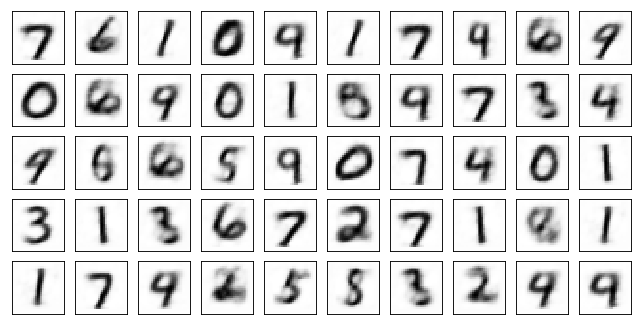

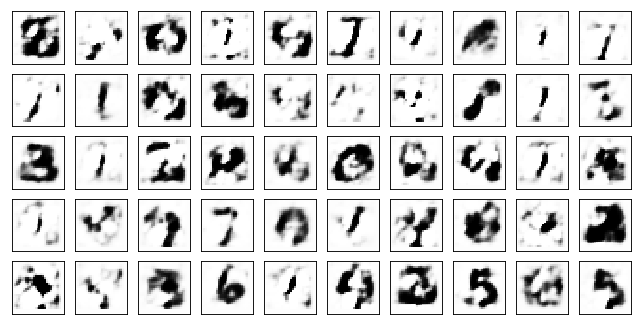

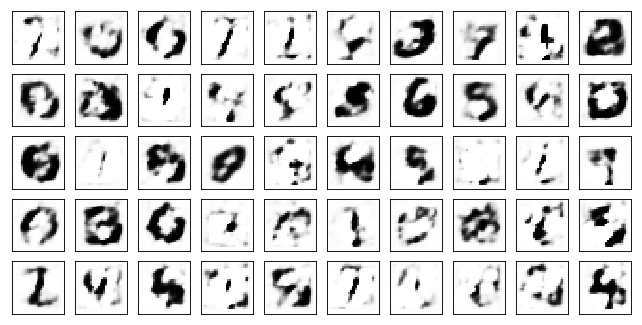

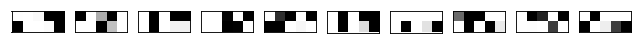

Model Adam Discr+dp:


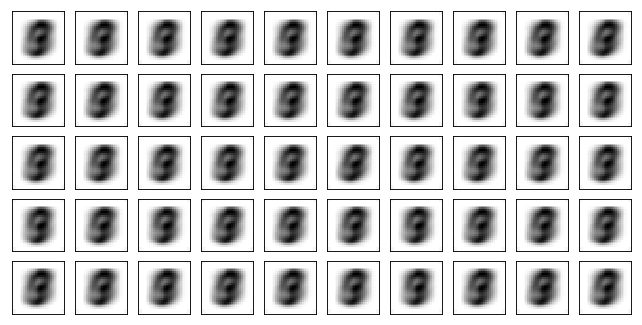

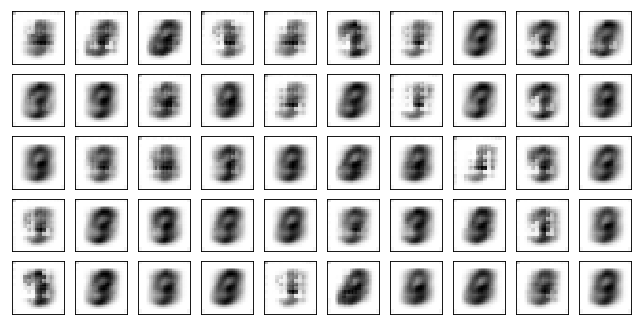

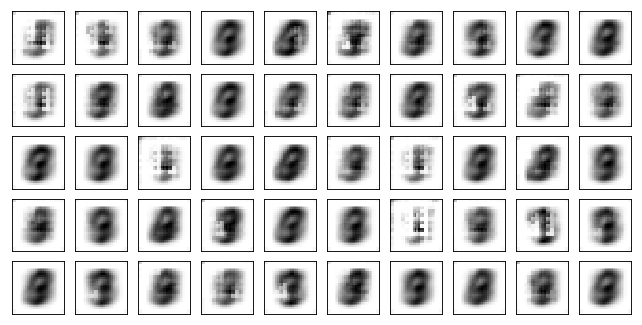

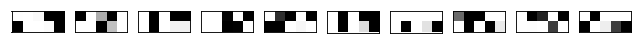

Model Adam Discr+bn+dp:


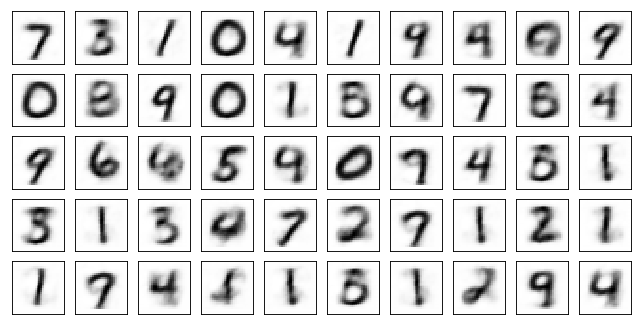

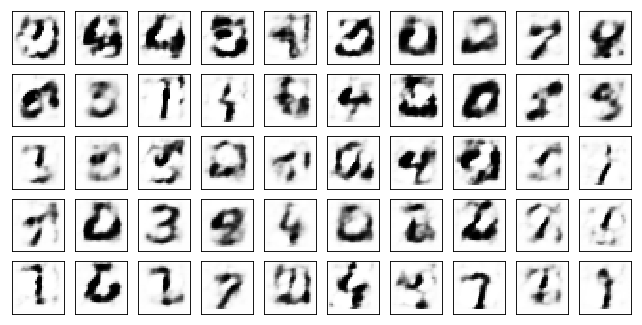

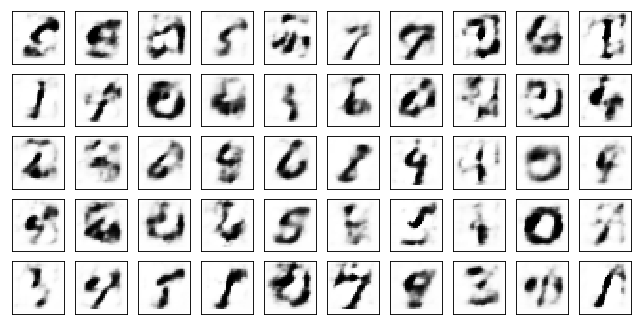

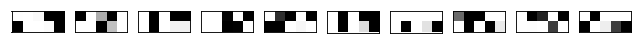

Test losses: 
Adam Discr+bn: 0.80001980 / 4.78814554 / 0.00242782 
Adam Discr+dp: 1.33063531 / 2.86466241 / 0.06066561 
Adam Discr+bn+dp: 0.78521961 / 2.90052843 / 0.07513756 

Train Epoch: 71 [0/50000 (0%)]	Losses Adam Discr+bn: AE:1.0589 D:0.0002 Adam Discr+dp: AE:0.8350 D:0.0050 Adam Discr+bn+dp: AE:0.7303 D:0.0066
Train Epoch: 71 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:1.0149 D:0.0003 Adam Discr+dp: AE:0.8250 D:0.0024 Adam Discr+bn+dp: AE:0.7148 D:0.0041
Train Epoch: 71 [50000/50000 (100%)]	Losses Adam Discr+bn: AE:1.0756 D:0.0006 Adam Discr+dp: AE:0.8116 D:0.0222 Adam Discr+bn+dp: AE:0.7871 D:0.0727
Test losses: 
Adam Discr+bn: 0.79900825 / 4.85077572 / 0.00407491 
Adam Discr+dp: 1.33146954 / 2.98727655 / 0.06177158 
Adam Discr+bn+dp: 0.78358006 / 2.91015029 / 0.06962792 

Train Epoch: 72 [0/50000 (0%)]	Losses Adam Discr+bn: AE:1.0519 D:0.0002 Adam Discr+dp: AE:0.8271 D:0.0031 Adam Discr+bn+dp: AE:0.7194 D:0.0060
Train Epoch: 72 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:1.

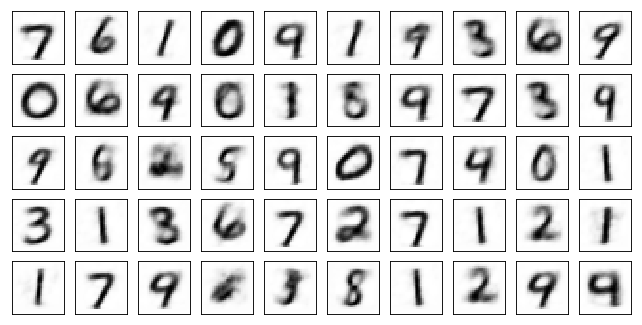

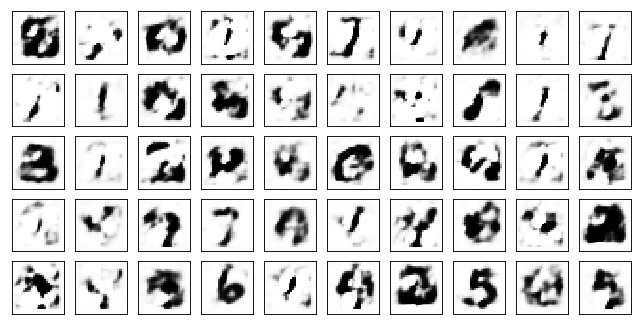

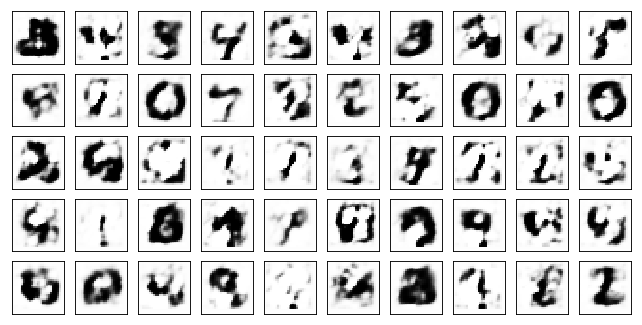

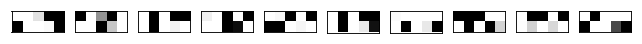

Model Adam Discr+dp:


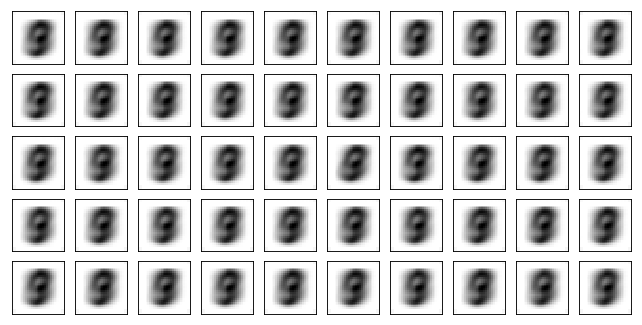

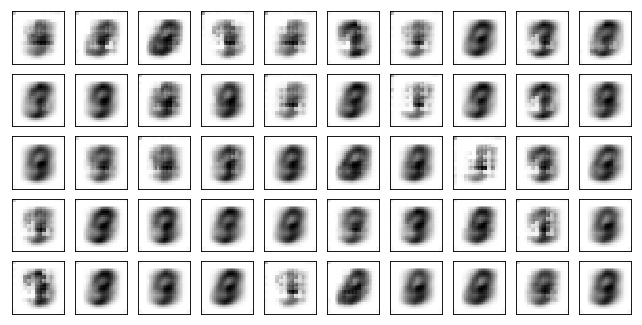

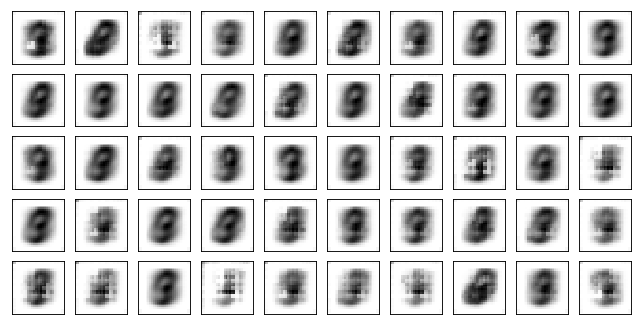

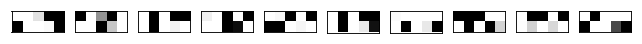

Model Adam Discr+bn+dp:


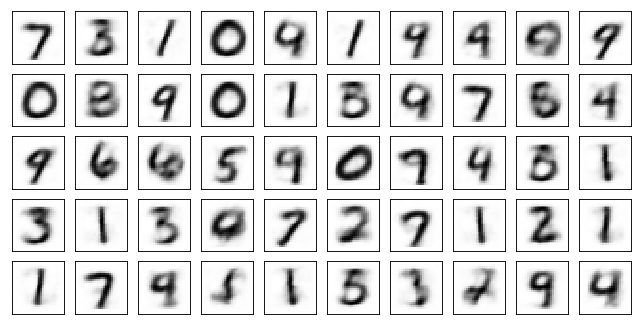

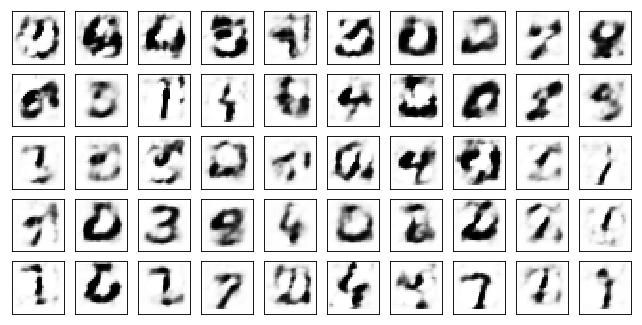

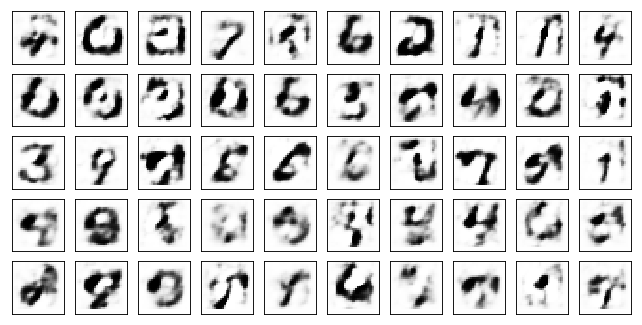

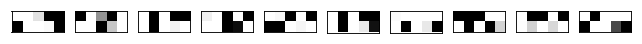

Test losses: 
Adam Discr+bn: 0.78960979 / 4.81477547 / 0.00284901 
Adam Discr+dp: 1.33200920 / 3.11995506 / 0.04881356 
Adam Discr+bn+dp: 0.77709210 / 3.02582359 / 0.06691155 

Train Epoch: 81 [0/50000 (0%)]	Losses Adam Discr+bn: AE:1.0448 D:0.0003 Adam Discr+dp: AE:0.8558 D:0.0040 Adam Discr+bn+dp: AE:0.7577 D:0.0064
Train Epoch: 81 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:1.0557 D:0.0002 Adam Discr+dp: AE:0.9120 D:0.0558 Adam Discr+bn+dp: AE:0.7666 D:0.0592
Train Epoch: 81 [50000/50000 (100%)]	Losses Adam Discr+bn: AE:1.1288 D:0.0001 Adam Discr+dp: AE:0.8627 D:0.0046 Adam Discr+bn+dp: AE:0.7821 D:0.0035
Test losses: 
Adam Discr+bn: 0.79032439 / 5.06235170 / 0.00397842 
Adam Discr+dp: 1.32798195 / 3.37252259 / 0.05255199 
Adam Discr+bn+dp: 0.77836937 / 3.08213830 / 0.06328594 

Train Epoch: 82 [0/50000 (0%)]	Losses Adam Discr+bn: AE:1.0918 D:0.0001 Adam Discr+dp: AE:0.8711 D:0.0030 Adam Discr+bn+dp: AE:0.7434 D:0.0241
Train Epoch: 82 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:1.

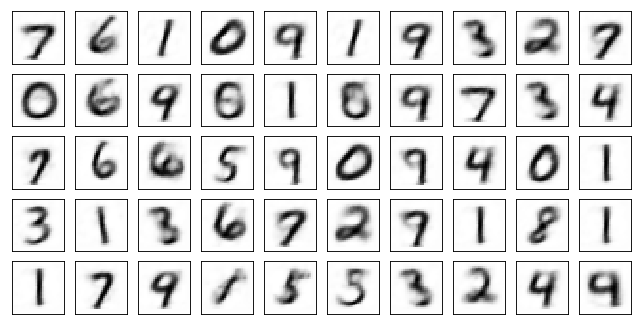

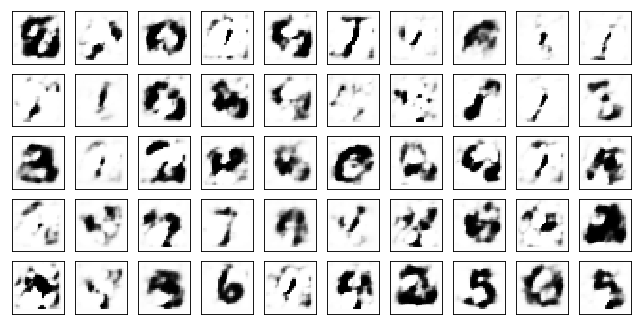

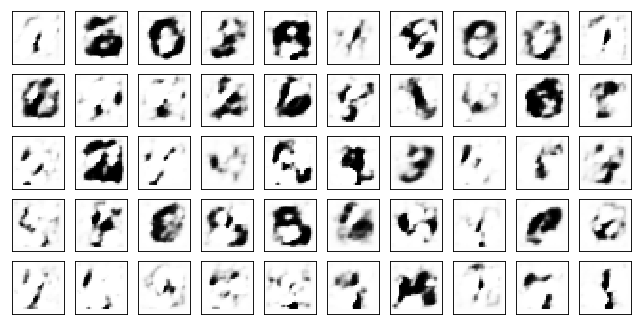

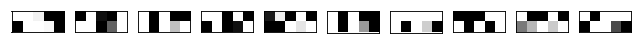

Model Adam Discr+dp:


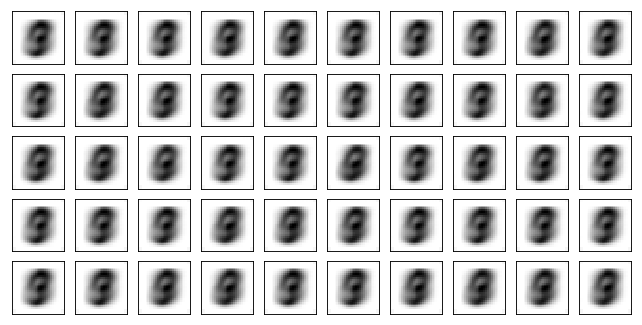

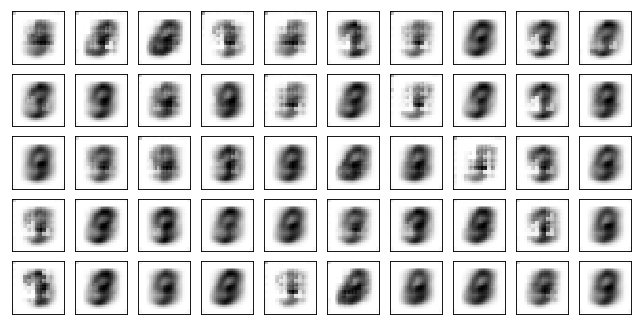

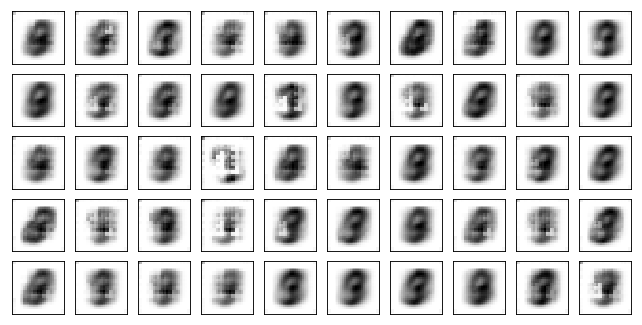

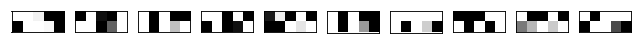

Model Adam Discr+bn+dp:


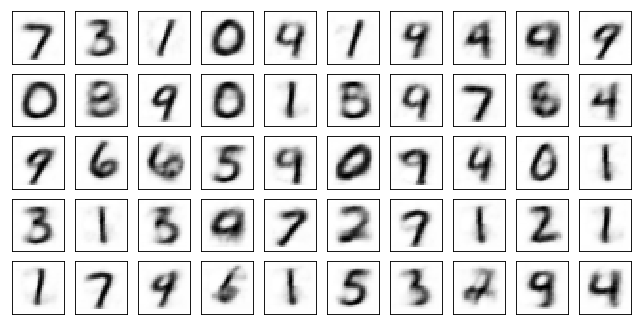

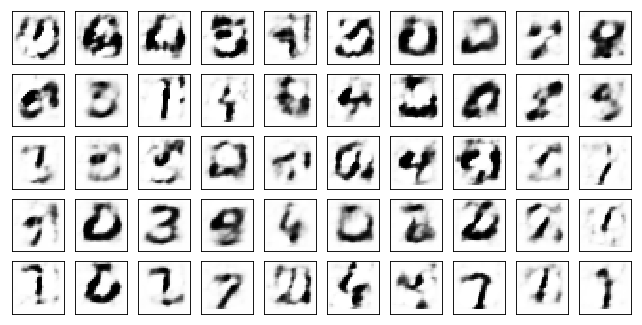

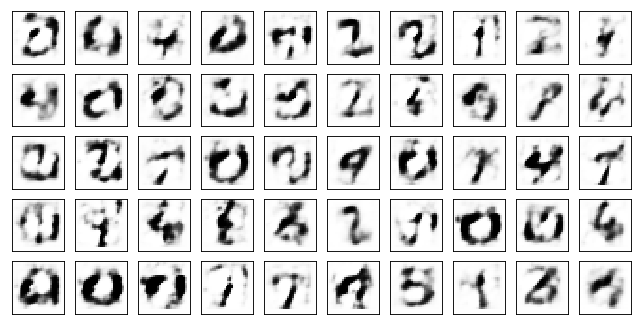

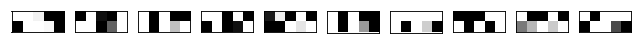

Test losses: 
Adam Discr+bn: 0.79658782 / 5.24744081 / 0.00380912 
Adam Discr+dp: 1.32008374 / 3.39134645 / 0.04696111 
Adam Discr+bn+dp: 0.76555121 / 3.16170073 / 0.05547918 

Train Epoch: 91 [0/50000 (0%)]	Losses Adam Discr+bn: AE:1.1534 D:0.0002 Adam Discr+dp: AE:0.9391 D:0.0340 Adam Discr+bn+dp: AE:0.8193 D:0.0044
Train Epoch: 91 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:1.1309 D:0.0001 Adam Discr+dp: AE:0.8911 D:0.0123 Adam Discr+bn+dp: AE:0.7598 D:0.0071
Train Epoch: 91 [50000/50000 (100%)]	Losses Adam Discr+bn: AE:1.1321 D:0.0001 Adam Discr+dp: AE:0.8916 D:0.0022 Adam Discr+bn+dp: AE:0.8144 D:0.0629
Test losses: 
Adam Discr+bn: 0.80575806 / 5.22834587 / 0.00296806 
Adam Discr+dp: 1.31944013 / 3.25084305 / 0.04847266 
Adam Discr+bn+dp: 0.76553631 / 3.17652392 / 0.06046086 

Train Epoch: 92 [0/50000 (0%)]	Losses Adam Discr+bn: AE:1.1119 D:0.0001 Adam Discr+dp: AE:0.9099 D:0.0019 Adam Discr+bn+dp: AE:0.7671 D:0.1093
Train Epoch: 92 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:0.

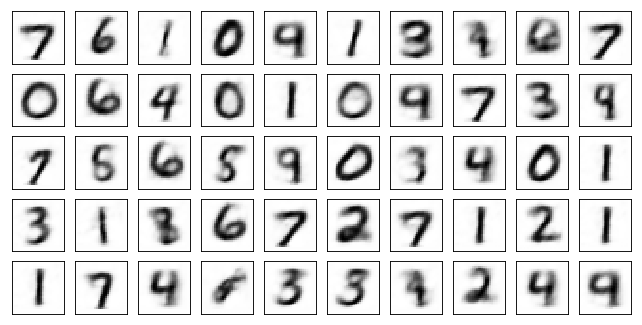

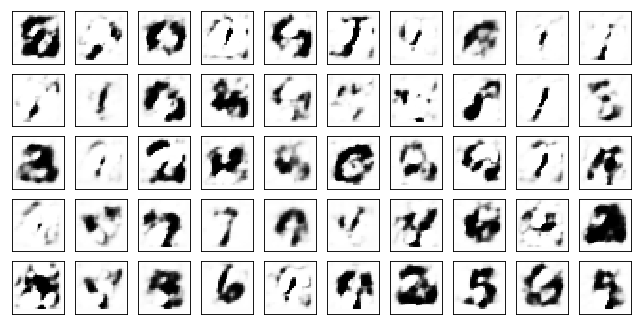

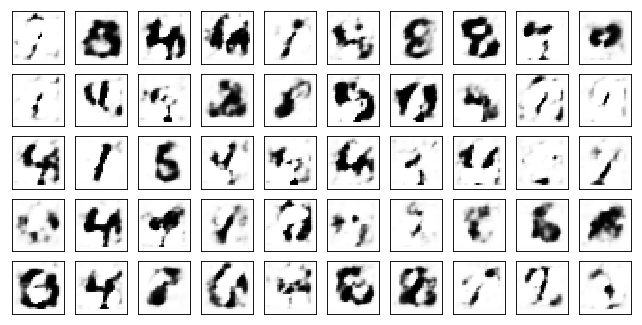

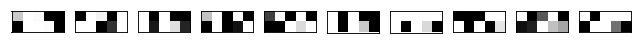

Model Adam Discr+dp:


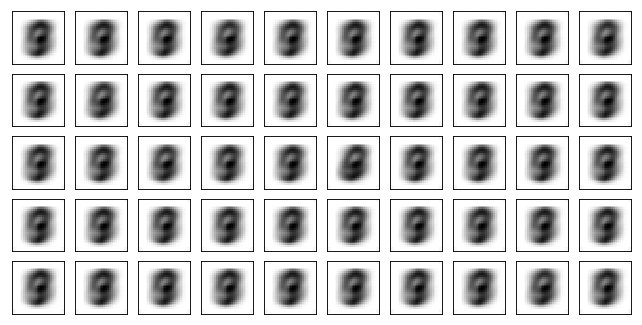

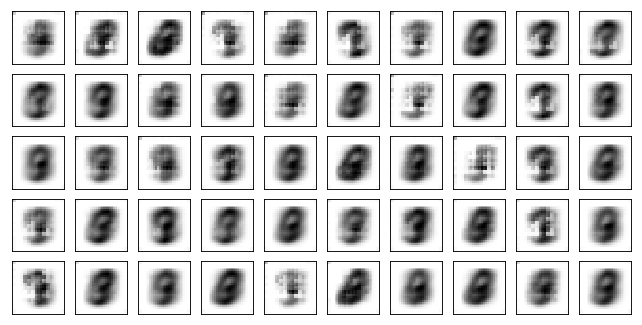

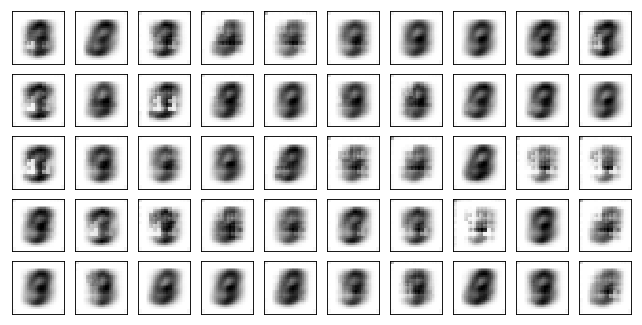

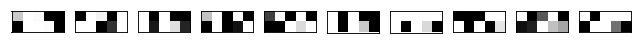

Model Adam Discr+bn+dp:


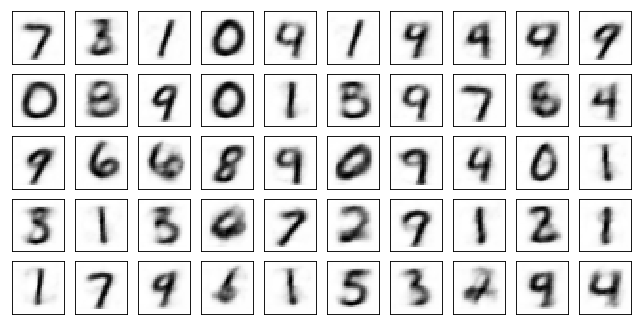

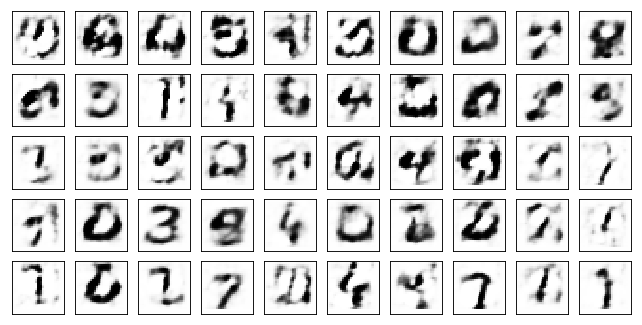

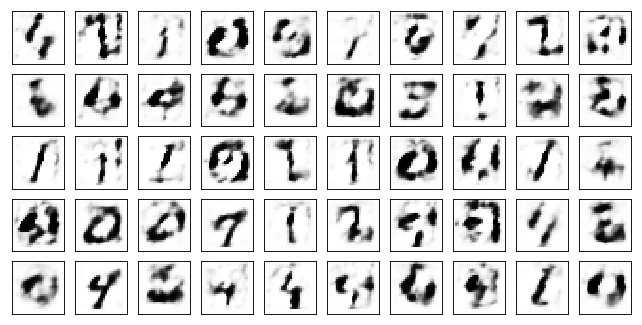

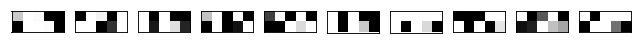

Test losses: 
Adam Discr+bn: 0.80070347 / 4.93469954 / 0.00141657 
Adam Discr+dp: 1.32104468 / 3.33556628 / 0.04054171 
Adam Discr+bn+dp: 0.75922436 / 3.07493496 / 0.04872246 

Train Epoch: 101 [0/50000 (0%)]	Losses Adam Discr+bn: AE:1.0454 D:0.0002 Adam Discr+dp: AE:0.9153 D:0.0019 Adam Discr+bn+dp: AE:0.7727 D:0.0367
Train Epoch: 101 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:1.1321 D:0.0001 Adam Discr+dp: AE:0.8375 D:0.0028 Adam Discr+bn+dp: AE:0.8050 D:0.0037
Train Epoch: 101 [50000/50000 (100%)]	Losses Adam Discr+bn: AE:1.0281 D:0.0003 Adam Discr+dp: AE:0.8995 D:0.0015 Adam Discr+bn+dp: AE:0.7930 D:0.0027
Test losses: 
Adam Discr+bn: 0.83046132 / 4.93931341 / 0.00177167 
Adam Discr+dp: 1.31666851 / 3.51390886 / 0.04215550 
Adam Discr+bn+dp: 0.75777286 / 3.17853045 / 0.04534069 

Train Epoch: 102 [0/50000 (0%)]	Losses Adam Discr+bn: AE:1.0570 D:0.0003 Adam Discr+dp: AE:0.9087 D:0.0017 Adam Discr+bn+dp: AE:0.7721 D:0.0022
Train Epoch: 102 [25000/50000 (50%)]	Losses Adam Discr+bn: 

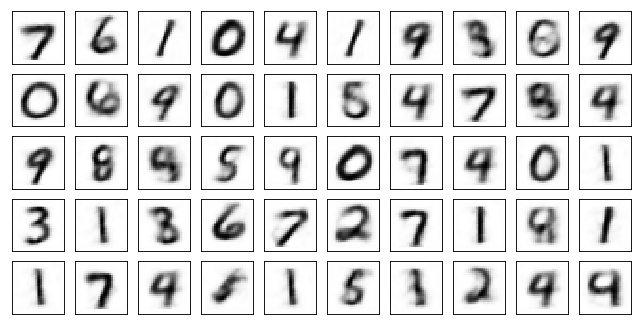

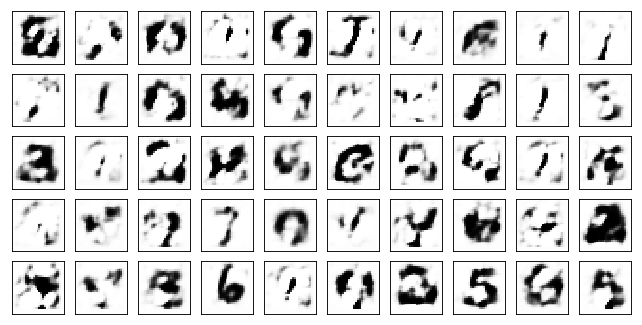

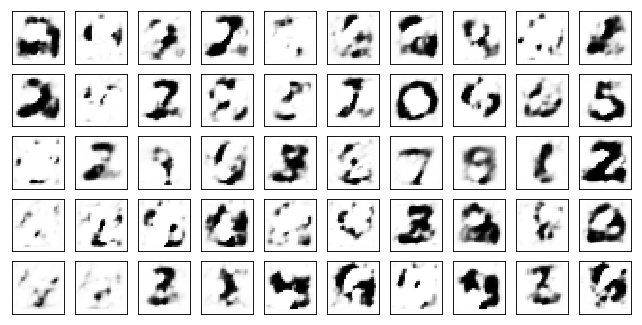

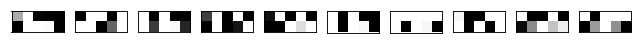

Model Adam Discr+dp:


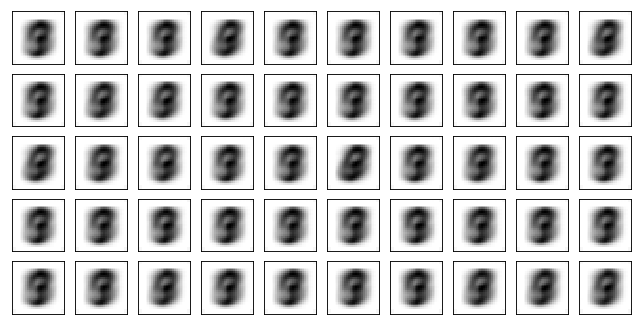

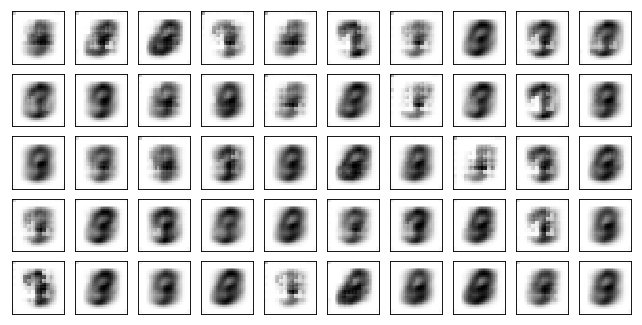

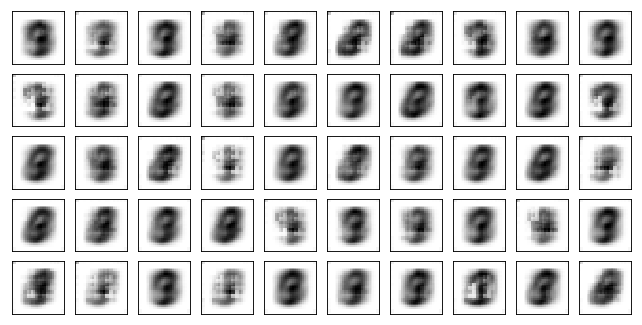

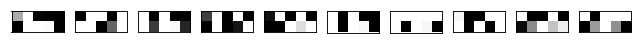

Model Adam Discr+bn+dp:


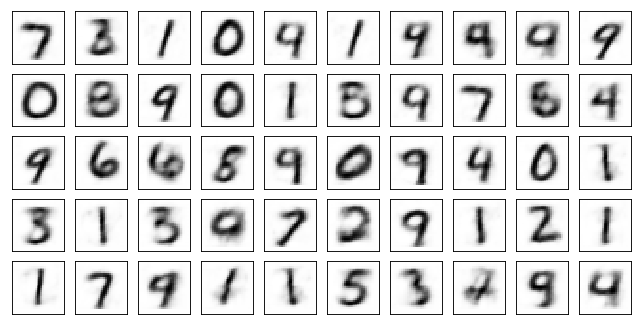

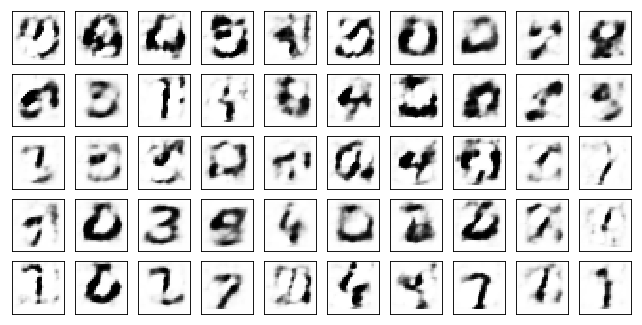

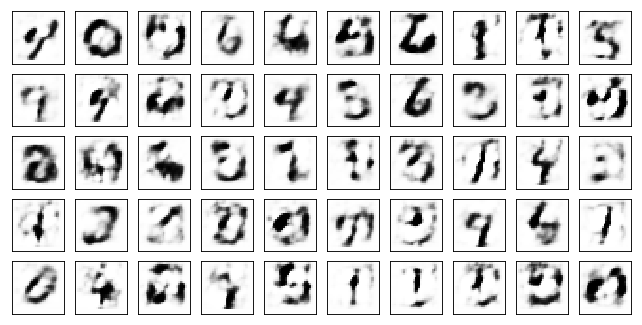

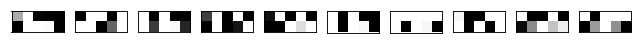

Test losses: 
Adam Discr+bn: 0.81177384 / 5.53150702 / 0.00125946 
Adam Discr+dp: 1.30665326 / 3.37772298 / 0.03793187 
Adam Discr+bn+dp: 0.75138992 / 3.31834078 / 0.04298423 

Train Epoch: 111 [0/50000 (0%)]	Losses Adam Discr+bn: AE:1.2214 D:0.0001 Adam Discr+dp: AE:0.9013 D:0.0384 Adam Discr+bn+dp: AE:0.8354 D:0.0022
Train Epoch: 111 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:1.0847 D:0.0001 Adam Discr+dp: AE:0.9069 D:0.0085 Adam Discr+bn+dp: AE:0.7656 D:0.0716
Train Epoch: 111 [50000/50000 (100%)]	Losses Adam Discr+bn: AE:1.2189 D:0.0000 Adam Discr+dp: AE:0.9554 D:0.0027 Adam Discr+bn+dp: AE:0.8288 D:0.0018
Test losses: 
Adam Discr+bn: 0.79823554 / 5.47962761 / 0.00415754 
Adam Discr+dp: 1.32188988 / 3.64309144 / 0.03263063 
Adam Discr+bn+dp: 0.75762832 / 3.40178823 / 0.04633528 

Train Epoch: 112 [0/50000 (0%)]	Losses Adam Discr+bn: AE:1.1691 D:0.0000 Adam Discr+dp: AE:0.9269 D:0.0074 Adam Discr+bn+dp: AE:0.7774 D:0.0023
Train Epoch: 112 [25000/50000 (50%)]	Losses Adam Discr+bn: 

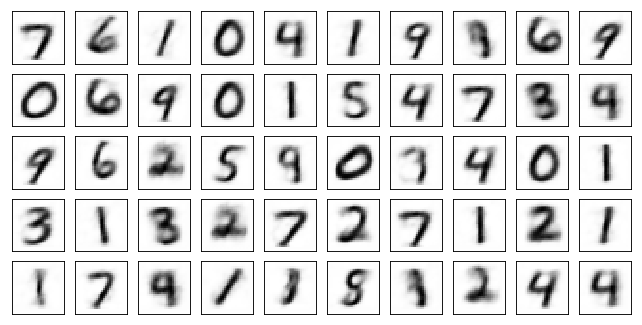

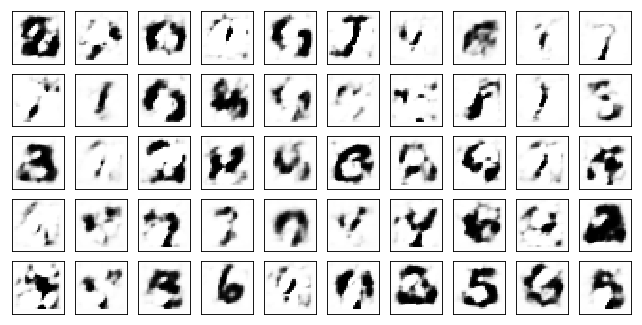

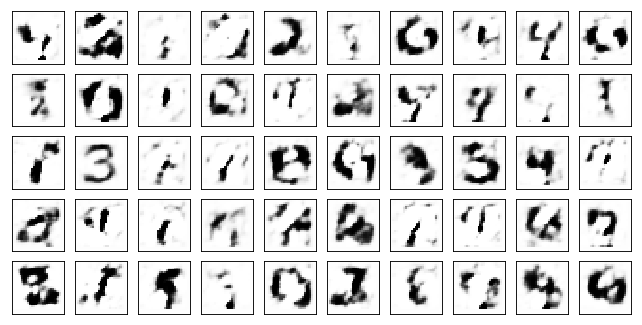

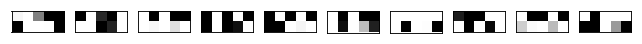

Model Adam Discr+dp:


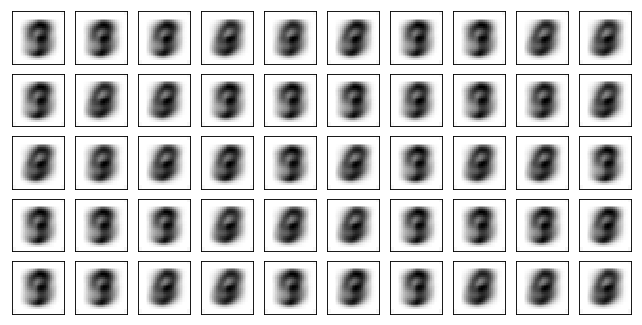

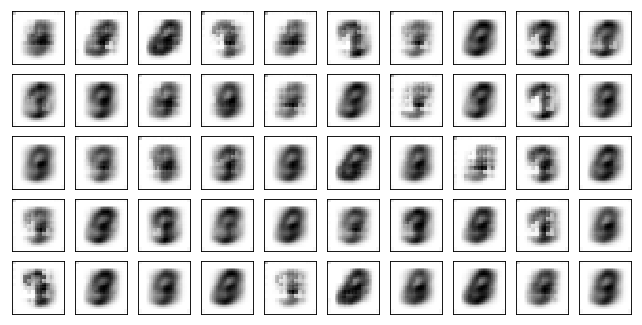

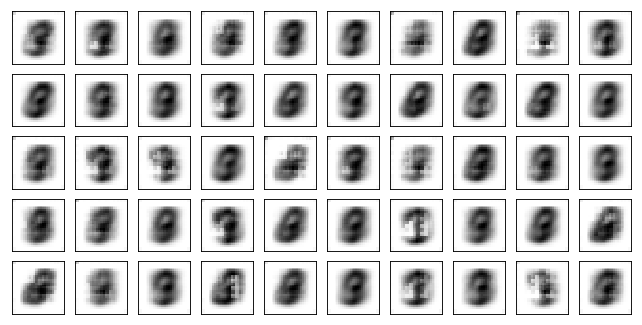

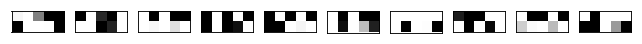

Model Adam Discr+bn+dp:


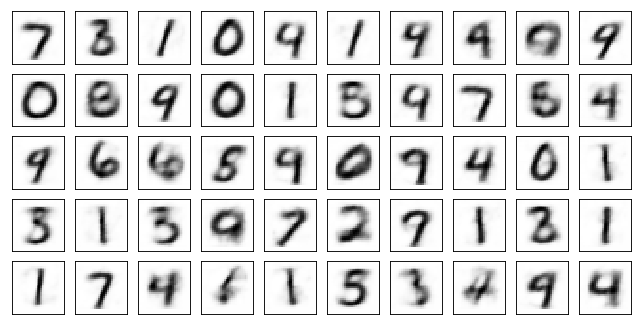

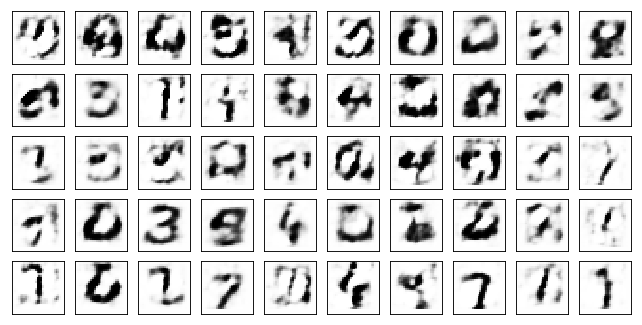

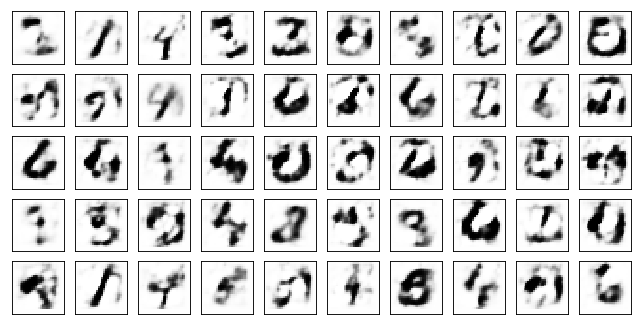

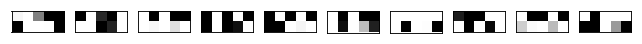

Test losses: 
Adam Discr+bn: 0.81130600 / 5.59055758 / 0.00259016 
Adam Discr+dp: 1.30470943 / 3.52238703 / 0.02527705 
Adam Discr+bn+dp: 0.74135411 / 3.40683675 / 0.04124259 

Train Epoch: 121 [0/50000 (0%)]	Losses Adam Discr+bn: AE:1.1884 D:0.0001 Adam Discr+dp: AE:0.9365 D:0.0031 Adam Discr+bn+dp: AE:0.8444 D:0.0015
Train Epoch: 121 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:1.1450 D:0.0002 Adam Discr+dp: AE:0.8848 D:0.0015 Adam Discr+bn+dp: AE:0.8007 D:0.0021
Train Epoch: 121 [50000/50000 (100%)]	Losses Adam Discr+bn: AE:1.1758 D:0.0001 Adam Discr+dp: AE:0.9234 D:0.0018 Adam Discr+bn+dp: AE:0.7830 D:0.0052
Test losses: 
Adam Discr+bn: 0.81871122 / 5.42302847 / 0.00181485 
Adam Discr+dp: 1.30257273 / 3.61562347 / 0.03059359 
Adam Discr+bn+dp: 0.74126285 / 3.33326221 / 0.03444562 

Train Epoch: 122 [0/50000 (0%)]	Losses Adam Discr+bn: AE:1.1648 D:0.0002 Adam Discr+dp: AE:0.9028 D:0.0021 Adam Discr+bn+dp: AE:0.7640 D:0.0161
Train Epoch: 122 [25000/50000 (50%)]	Losses Adam Discr+bn: 

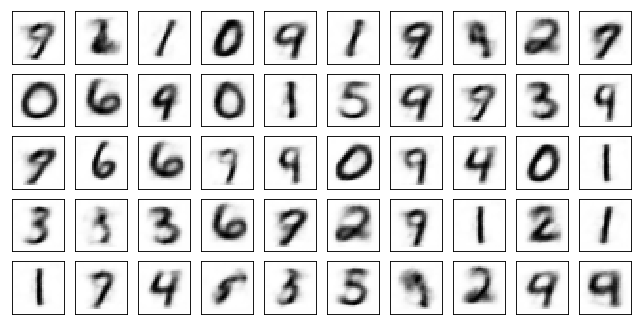

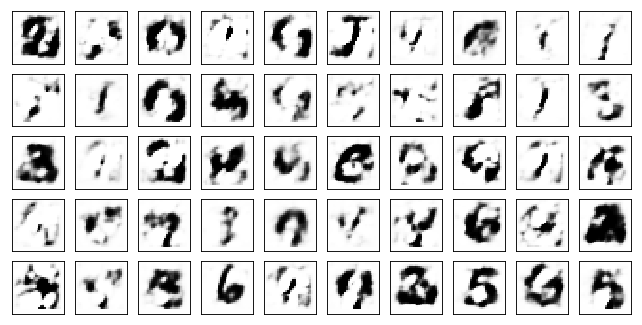

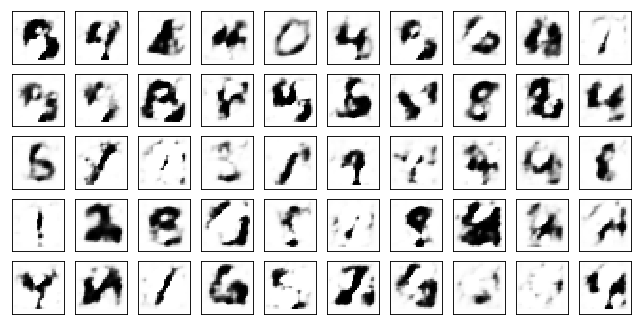

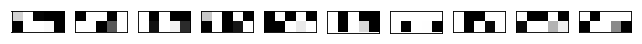

Model Adam Discr+dp:


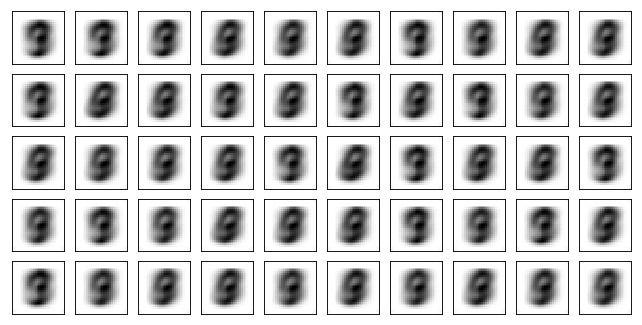

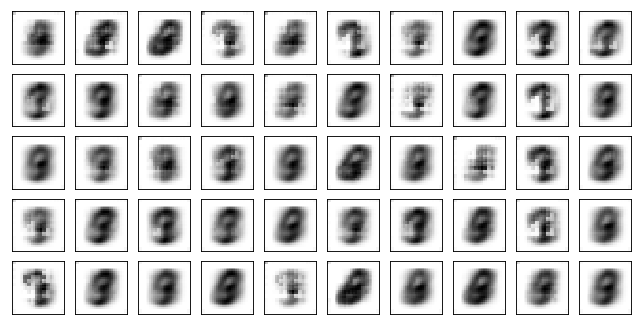

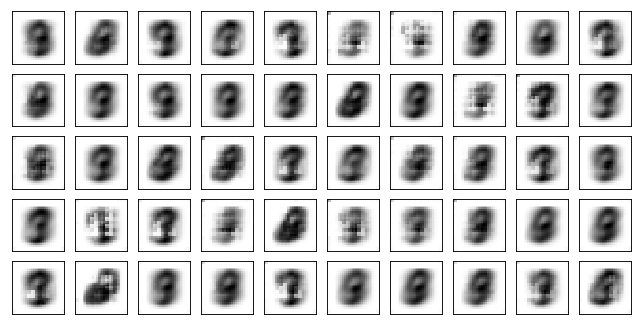

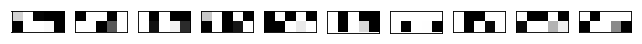

Model Adam Discr+bn+dp:


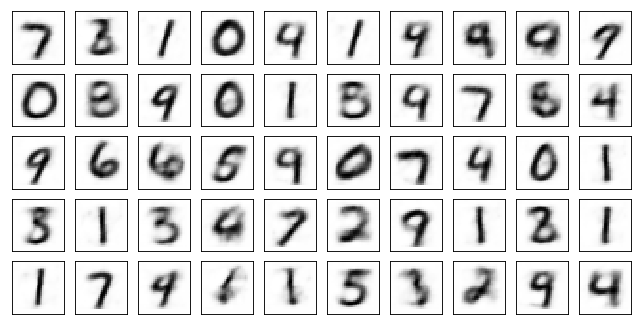

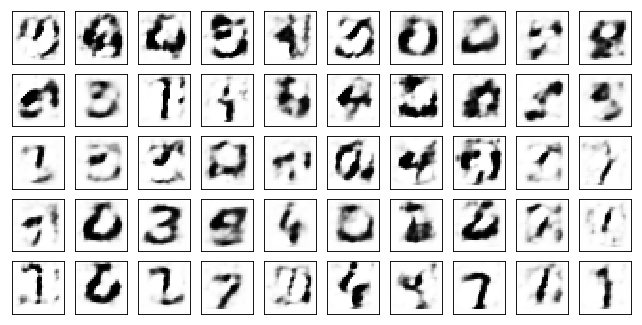

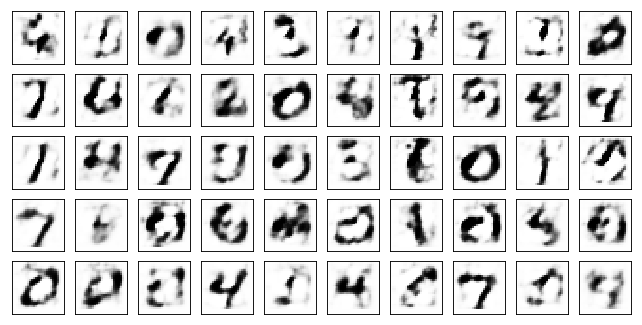

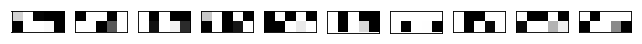

Test losses: 
Adam Discr+bn: 0.85257745 / 5.30794525 / 0.00084019 
Adam Discr+dp: 1.30670631 / 3.67730069 / 0.02940962 
Adam Discr+bn+dp: 0.73431480 / 3.34117889 / 0.03617354 

Train Epoch: 131 [0/50000 (0%)]	Losses Adam Discr+bn: AE:1.1749 D:0.0001 Adam Discr+dp: AE:0.9290 D:0.0017 Adam Discr+bn+dp: AE:0.7396 D:0.0030
Train Epoch: 131 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:1.1502 D:0.0005 Adam Discr+dp: AE:0.8596 D:0.0073 Adam Discr+bn+dp: AE:0.8548 D:0.0027
Train Epoch: 131 [50000/50000 (100%)]	Losses Adam Discr+bn: AE:1.1453 D:0.0001 Adam Discr+dp: AE:0.9112 D:0.0023 Adam Discr+bn+dp: AE:0.8670 D:0.0021
Test losses: 
Adam Discr+bn: 0.80749893 / 5.28021240 / 0.00183958 
Adam Discr+dp: 1.31221020 / 3.53058076 / 0.02855537 
Adam Discr+bn+dp: 0.73314124 / 3.60089684 / 0.03439179 

Train Epoch: 132 [0/50000 (0%)]	Losses Adam Discr+bn: AE:1.1202 D:0.0002 Adam Discr+dp: AE:0.9254 D:0.0036 Adam Discr+bn+dp: AE:0.8388 D:0.0012
Train Epoch: 132 [25000/50000 (50%)]	Losses Adam Discr+bn: 

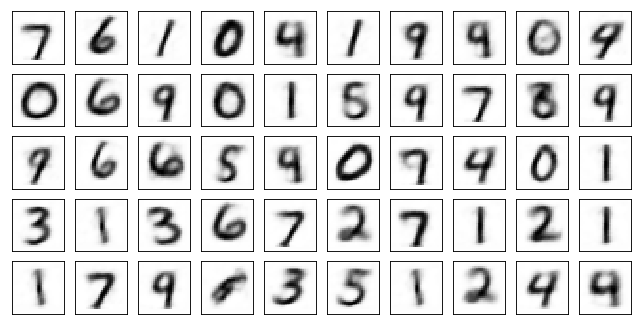

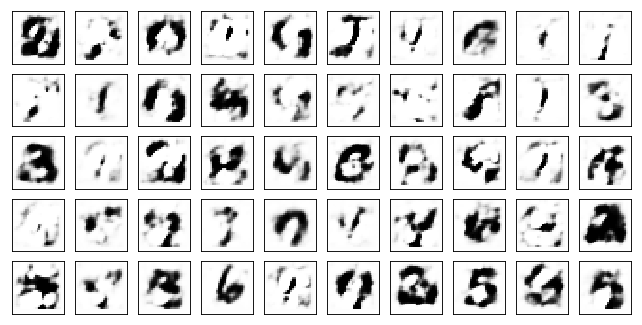

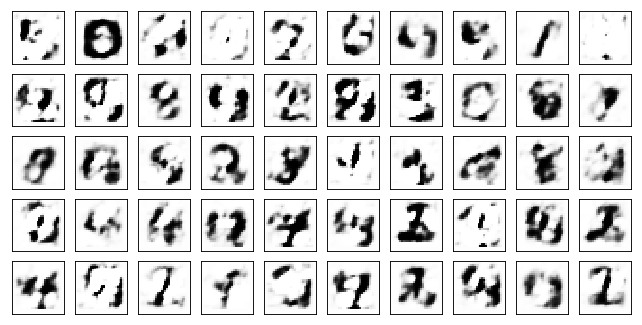

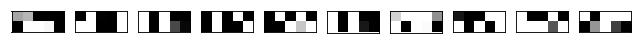

Model Adam Discr+dp:


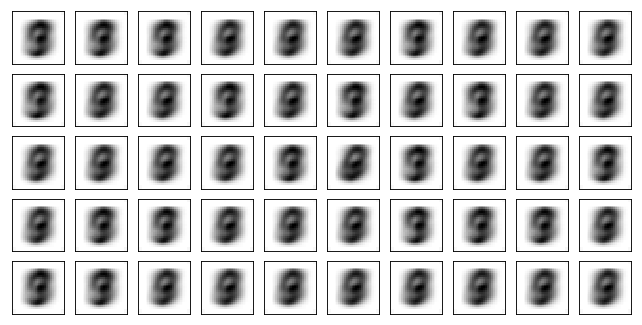

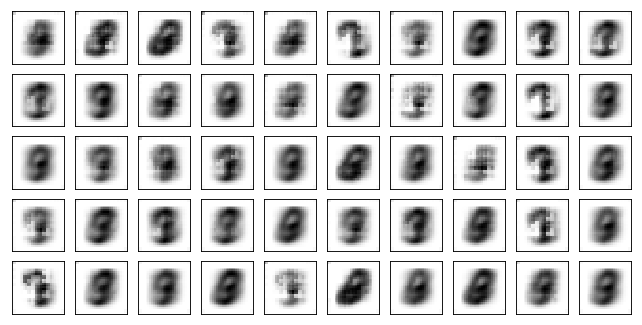

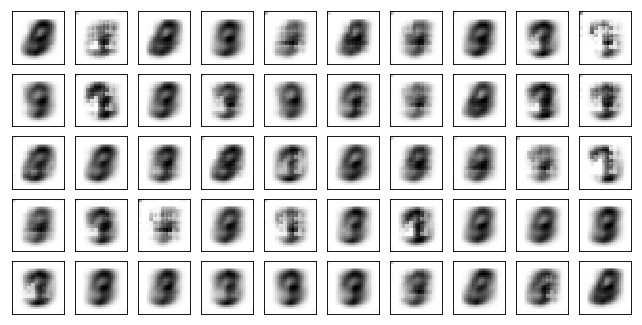

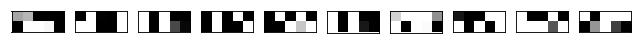

Model Adam Discr+bn+dp:


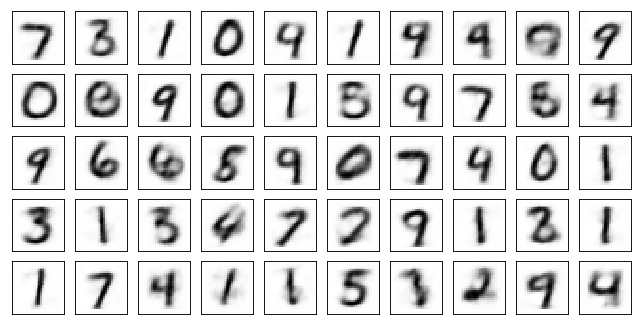

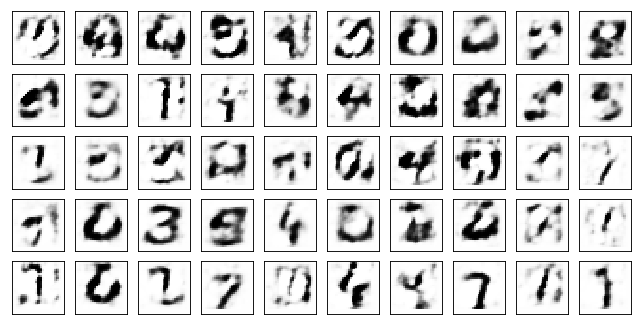

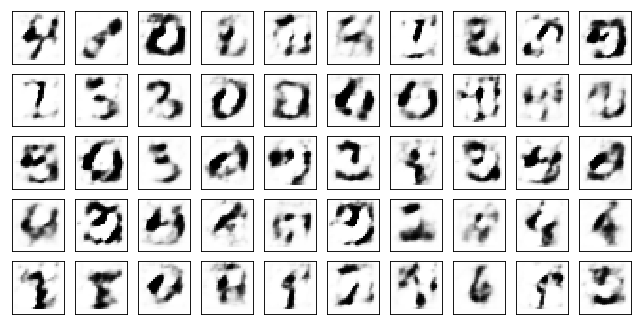

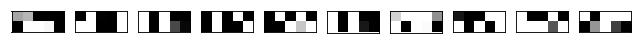

Test losses: 
Adam Discr+bn: 0.79633170 / 5.68561554 / 0.00063249 
Adam Discr+dp: 1.30876458 / 3.94240689 / 0.02593735 
Adam Discr+bn+dp: 0.74152344 / 3.63604617 / 0.03058202 

Train Epoch: 141 [0/50000 (0%)]	Losses Adam Discr+bn: AE:1.2090 D:0.0002 Adam Discr+dp: AE:0.9139 D:0.0023 Adam Discr+bn+dp: AE:0.8241 D:0.0019
Train Epoch: 141 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:1.1438 D:0.0001 Adam Discr+dp: AE:0.9637 D:0.0020 Adam Discr+bn+dp: AE:0.8129 D:0.0012
Train Epoch: 141 [50000/50000 (100%)]	Losses Adam Discr+bn: AE:1.1192 D:0.0001 Adam Discr+dp: AE:0.9294 D:0.0018 Adam Discr+bn+dp: AE:0.8199 D:0.0026
Test losses: 
Adam Discr+bn: 0.79886407 / 5.31102276 / 0.00068919 
Adam Discr+dp: 1.29512155 / 3.80477309 / 0.02744407 
Adam Discr+bn+dp: 0.73245597 / 3.44263744 / 0.02938141 

Train Epoch: 142 [0/50000 (0%)]	Losses Adam Discr+bn: AE:1.1206 D:0.0001 Adam Discr+dp: AE:0.9961 D:0.0026 Adam Discr+bn+dp: AE:0.8263 D:0.0020
Train Epoch: 142 [25000/50000 (50%)]	Losses Adam Discr+bn: 

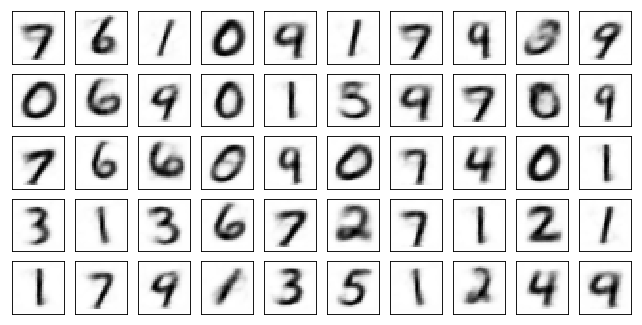

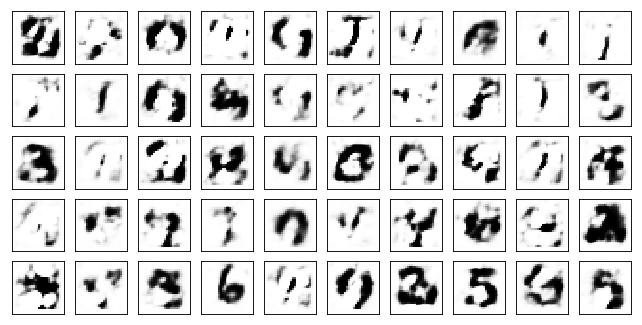

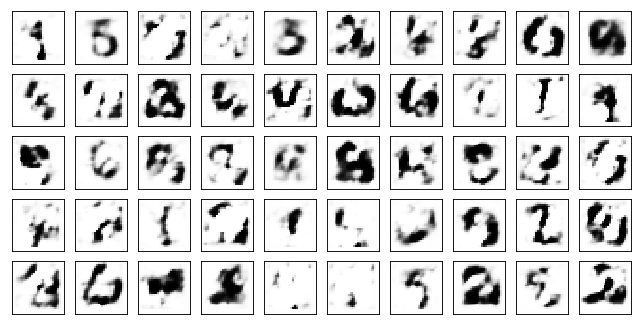

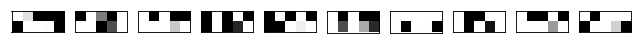

Model Adam Discr+dp:


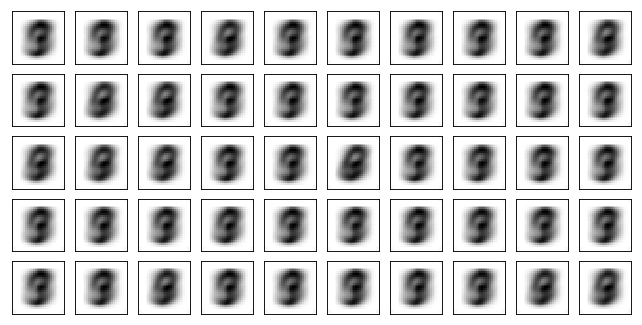

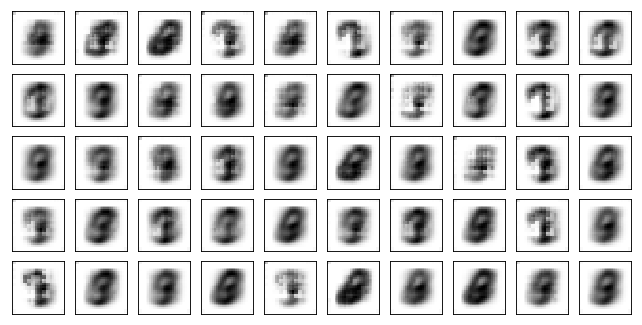

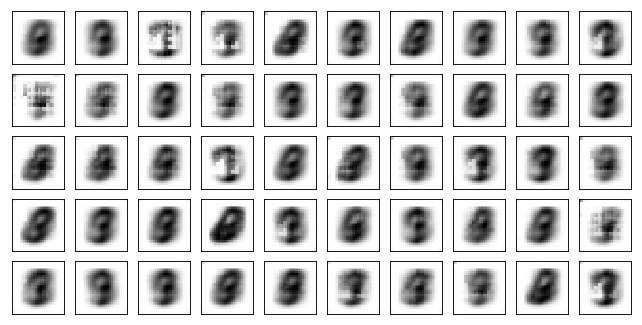

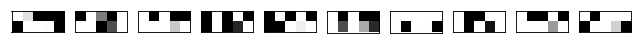

Model Adam Discr+bn+dp:


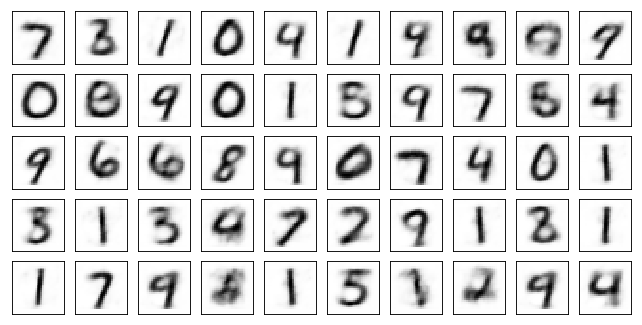

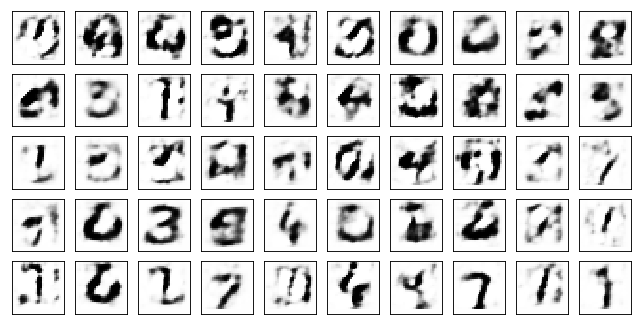

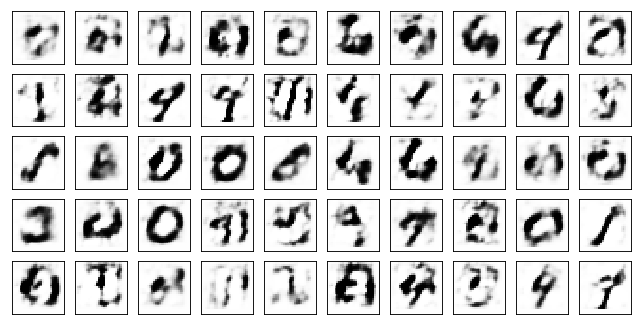

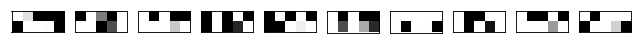

Test losses: 
Adam Discr+bn: 0.78504020 / 5.80652857 / 0.00159555 
Adam Discr+dp: 1.30885911 / 3.79197836 / 0.02553571 
Adam Discr+bn+dp: 0.73135865 / 3.52279258 / 0.02655719 

Train Epoch: 151 [0/50000 (0%)]	Losses Adam Discr+bn: AE:1.2095 D:0.0000 Adam Discr+dp: AE:0.9444 D:0.0013 Adam Discr+bn+dp: AE:0.7962 D:0.0014
Train Epoch: 151 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:1.2079 D:0.0001 Adam Discr+dp: AE:0.9161 D:0.0016 Adam Discr+bn+dp: AE:0.8229 D:0.0020
Train Epoch: 151 [50000/50000 (100%)]	Losses Adam Discr+bn: AE:1.2587 D:0.0000 Adam Discr+dp: AE:0.9494 D:0.0015 Adam Discr+bn+dp: AE:0.8156 D:0.0014
Test losses: 
Adam Discr+bn: 0.81204921 / 5.80443048 / 0.00083146 
Adam Discr+dp: 1.29915404 / 3.93052030 / 0.02377725 
Adam Discr+bn+dp: 0.73755217 / 3.67299175 / 0.02953985 

Train Epoch: 152 [0/50000 (0%)]	Losses Adam Discr+bn: AE:1.2598 D:0.0000 Adam Discr+dp: AE:0.9286 D:0.0006 Adam Discr+bn+dp: AE:0.8373 D:0.0014
Train Epoch: 152 [25000/50000 (50%)]	Losses Adam Discr+bn: 

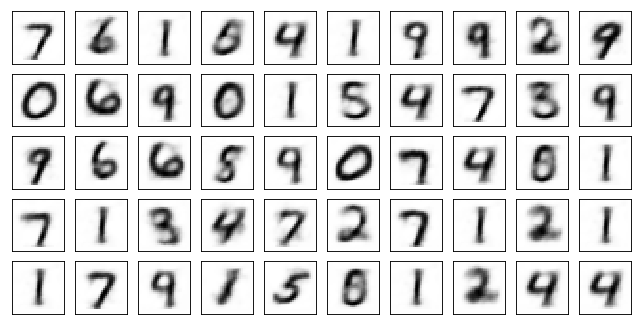

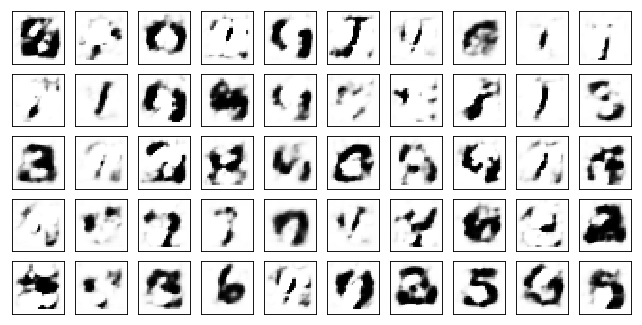

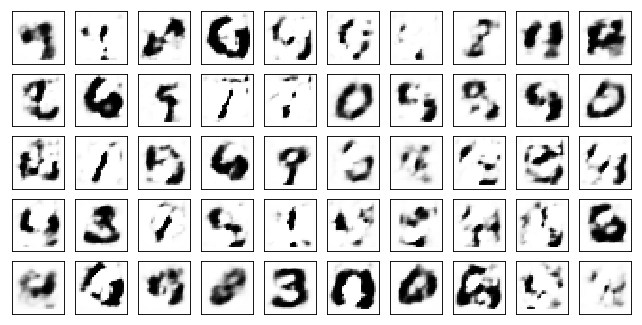

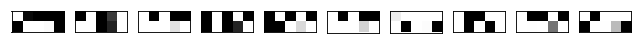

Model Adam Discr+dp:


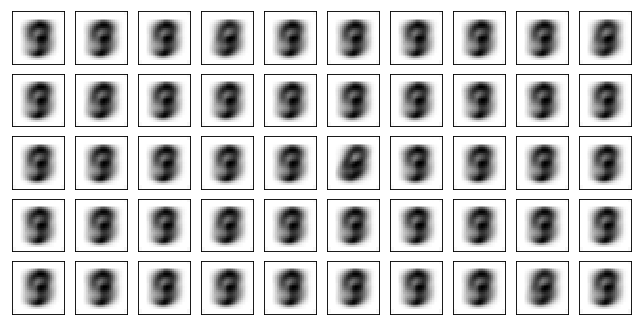

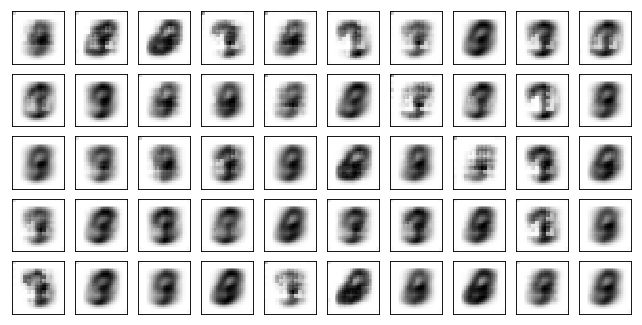

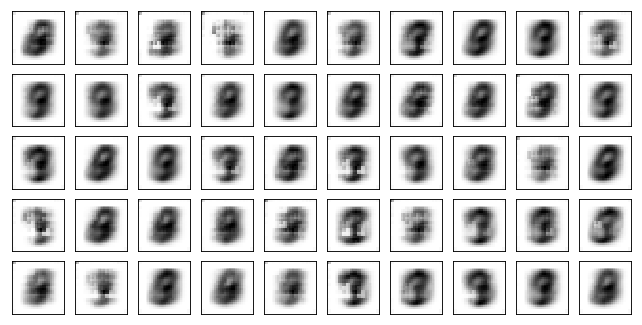

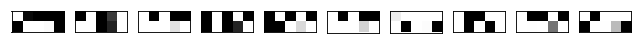

Model Adam Discr+bn+dp:


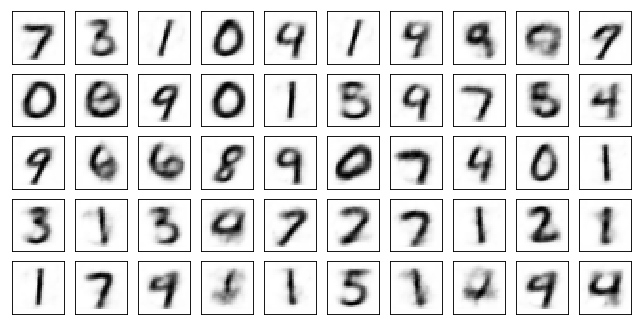

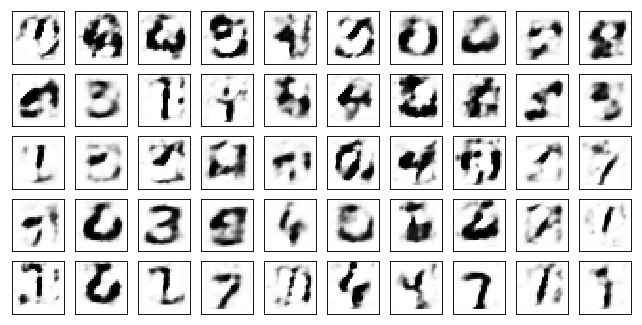

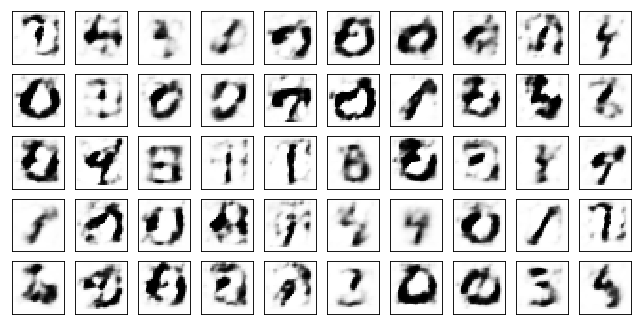

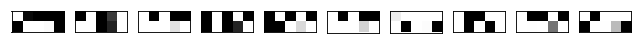

Test losses: 
Adam Discr+bn: 0.85153729 / 5.24495602 / 0.00200111 
Adam Discr+dp: 1.30786586 / 4.17457867 / 0.02272378 
Adam Discr+bn+dp: 0.72951359 / 3.70011377 / 0.02917840 

Train Epoch: 161 [0/50000 (0%)]	Losses Adam Discr+bn: AE:1.1029 D:0.0003 Adam Discr+dp: AE:1.0373 D:0.0006 Adam Discr+bn+dp: AE:0.8580 D:0.0012
Train Epoch: 161 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:1.2044 D:0.0001 Adam Discr+dp: AE:0.9913 D:0.0014 Adam Discr+bn+dp: AE:0.8435 D:0.0018
Train Epoch: 161 [50000/50000 (100%)]	Losses Adam Discr+bn: AE:1.2427 D:0.0000 Adam Discr+dp: AE:1.0057 D:0.0012 Adam Discr+bn+dp: AE:0.8237 D:0.0010
Test losses: 
Adam Discr+bn: 0.78695273 / 5.76303625 / 0.00240525 
Adam Discr+dp: 1.31743813 / 3.86895251 / 0.02160621 
Adam Discr+bn+dp: 0.72591221 / 3.69504166 / 0.02496488 

Train Epoch: 162 [0/50000 (0%)]	Losses Adam Discr+bn: AE:1.2431 D:0.0000 Adam Discr+dp: AE:0.9632 D:0.0008 Adam Discr+bn+dp: AE:0.8765 D:0.0072
Train Epoch: 162 [25000/50000 (50%)]	Losses Adam Discr+bn: 

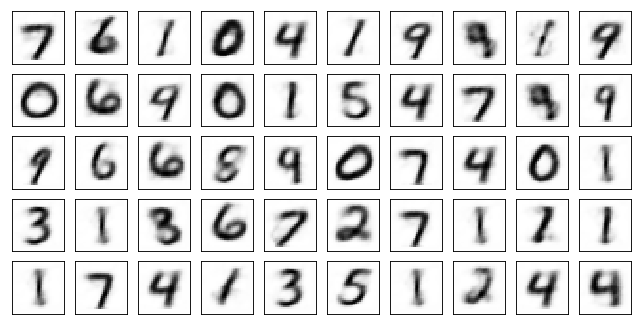

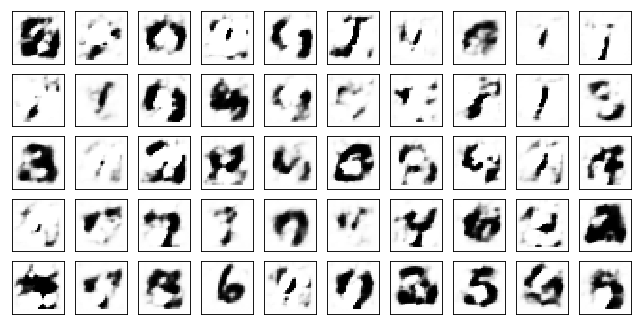

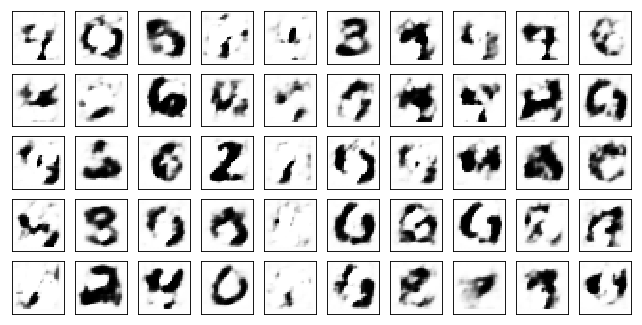

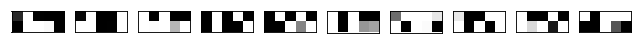

Model Adam Discr+dp:


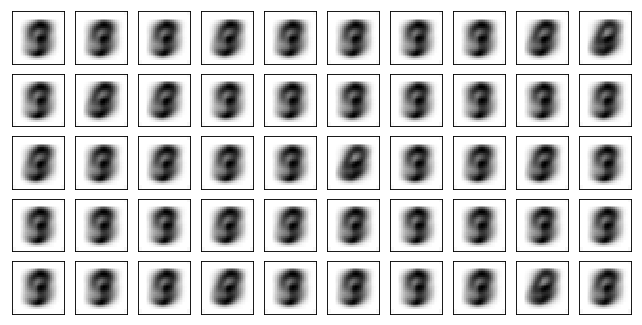

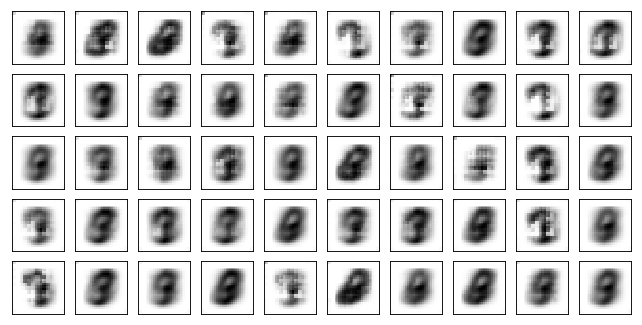

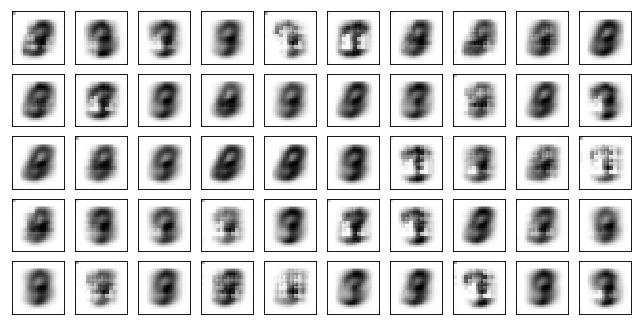

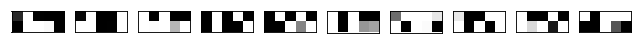

Model Adam Discr+bn+dp:


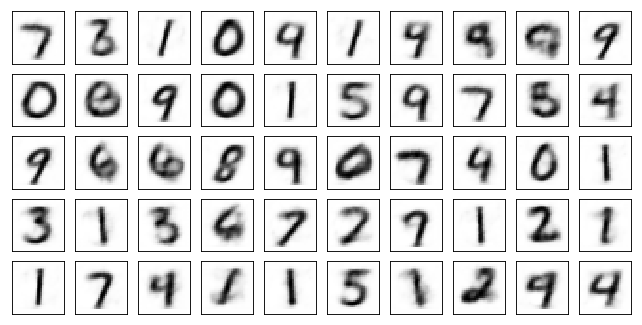

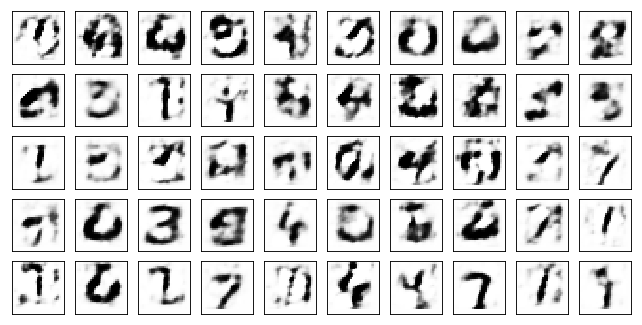

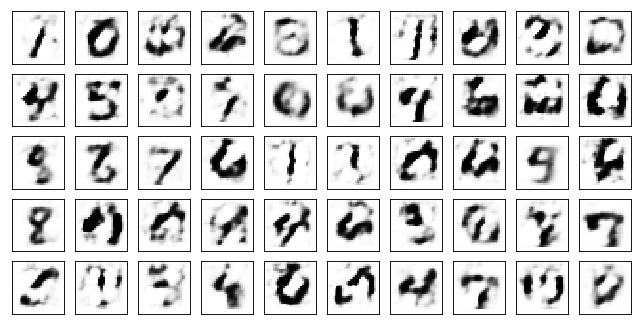

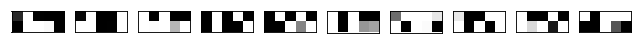

Test losses: 
Adam Discr+bn: 0.78467685 / 5.71971369 / 0.00115750 
Adam Discr+dp: 1.29676402 / 4.24284124 / 0.02339281 
Adam Discr+bn+dp: 0.73394120 / 3.74603391 / 0.02559687 

Train Epoch: 171 [0/50000 (0%)]	Losses Adam Discr+bn: AE:1.2089 D:0.0001 Adam Discr+dp: AE:1.0091 D:0.0017 Adam Discr+bn+dp: AE:0.8453 D:0.0011
Train Epoch: 171 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:1.1848 D:0.0001 Adam Discr+dp: AE:0.9639 D:0.0006 Adam Discr+bn+dp: AE:0.8893 D:0.0012
Train Epoch: 171 [50000/50000 (100%)]	Losses Adam Discr+bn: AE:1.2927 D:0.0000 Adam Discr+dp: AE:0.9886 D:0.0008 Adam Discr+bn+dp: AE:0.8755 D:0.0013
Test losses: 
Adam Discr+bn: 0.80166745 / 5.85943174 / 0.00135184 
Adam Discr+dp: 1.30834043 / 4.23381281 / 0.02654530 
Adam Discr+bn+dp: 0.72803754 / 3.68207932 / 0.02506111 

Train Epoch: 172 [0/50000 (0%)]	Losses Adam Discr+bn: AE:1.2254 D:0.0000 Adam Discr+dp: AE:1.0169 D:0.0264 Adam Discr+bn+dp: AE:0.8108 D:0.0014
Train Epoch: 172 [25000/50000 (50%)]	Losses Adam Discr+bn: 

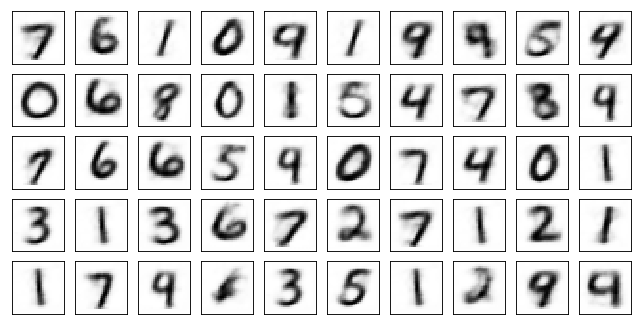

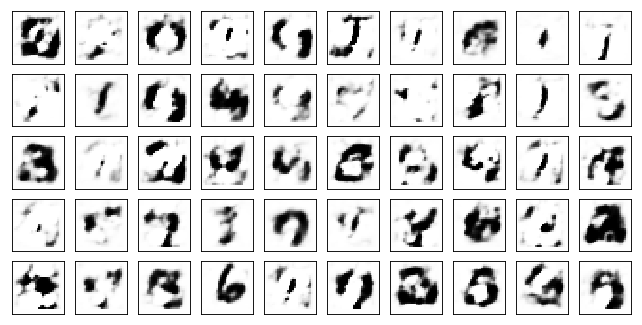

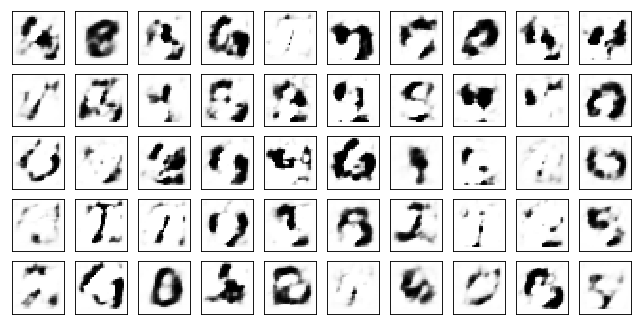

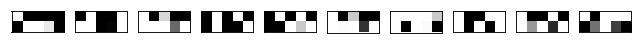

Model Adam Discr+dp:


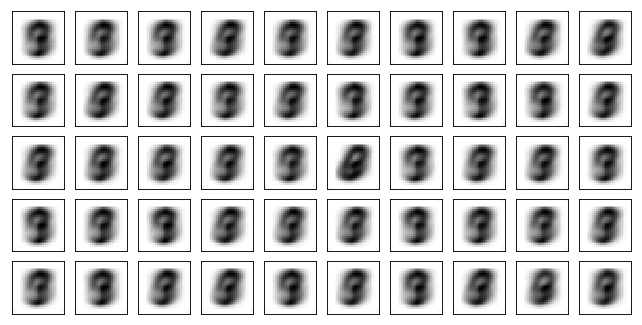

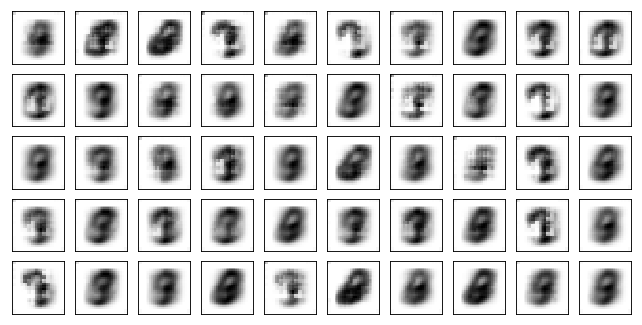

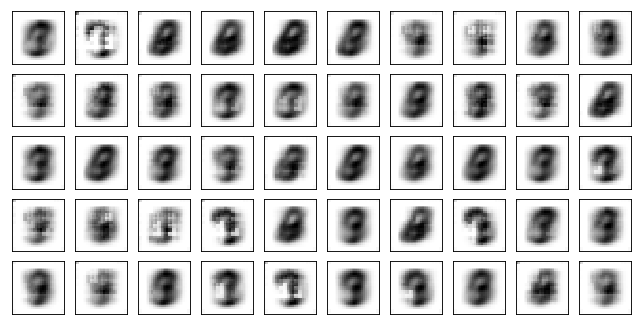

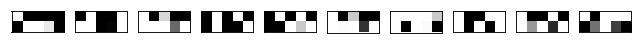

Model Adam Discr+bn+dp:


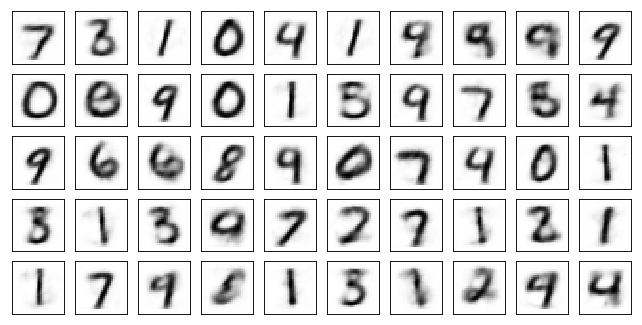

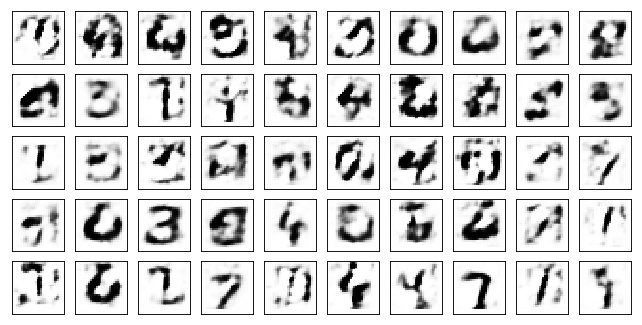

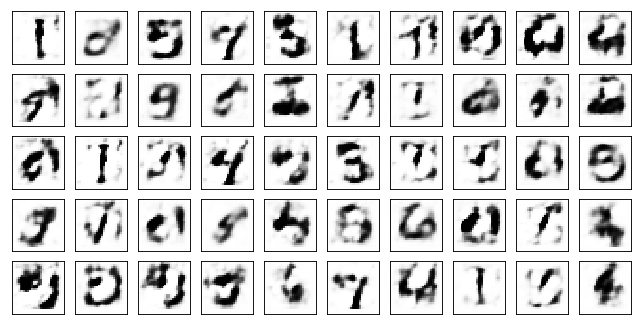

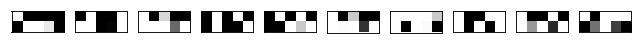

Test losses: 
Adam Discr+bn: 0.79522759 / 5.83712578 / 0.00052776 
Adam Discr+dp: 1.28373885 / 4.01417971 / 0.02034761 
Adam Discr+bn+dp: 0.72887939 / 3.86424255 / 0.02474832 

Train Epoch: 181 [0/50000 (0%)]	Losses Adam Discr+bn: AE:1.2429 D:0.0001 Adam Discr+dp: AE:1.0282 D:0.0014 Adam Discr+bn+dp: AE:0.8682 D:0.0013
Train Epoch: 181 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:1.3341 D:0.0000 Adam Discr+dp: AE:0.9790 D:0.0023 Adam Discr+bn+dp: AE:0.8583 D:0.0212
Train Epoch: 181 [50000/50000 (100%)]	Losses Adam Discr+bn: AE:1.2824 D:0.0000 Adam Discr+dp: AE:1.0064 D:0.0011 Adam Discr+bn+dp: AE:0.8825 D:0.0028
Test losses: 
Adam Discr+bn: 0.87334174 / 5.81730318 / 0.00167851 
Adam Discr+dp: 1.28617215 / 4.36439800 / 0.01891997 
Adam Discr+bn+dp: 0.72396523 / 3.82175136 / 0.02245377 

Train Epoch: 182 [0/50000 (0%)]	Losses Adam Discr+bn: AE:1.2409 D:0.0001 Adam Discr+dp: AE:1.0065 D:0.0007 Adam Discr+bn+dp: AE:0.8518 D:0.0020
Train Epoch: 182 [25000/50000 (50%)]	Losses Adam Discr+bn: 

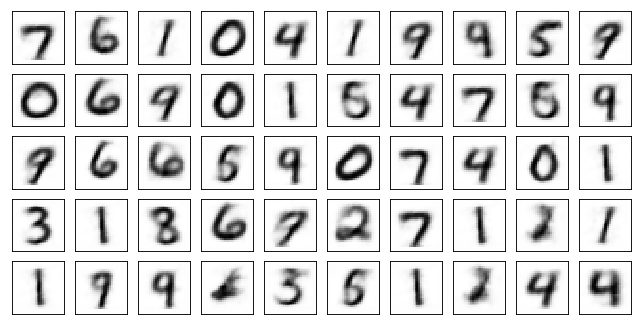

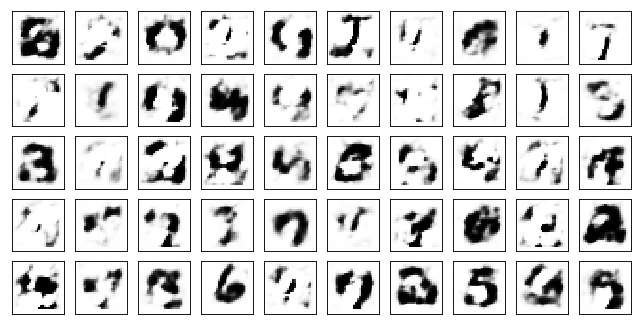

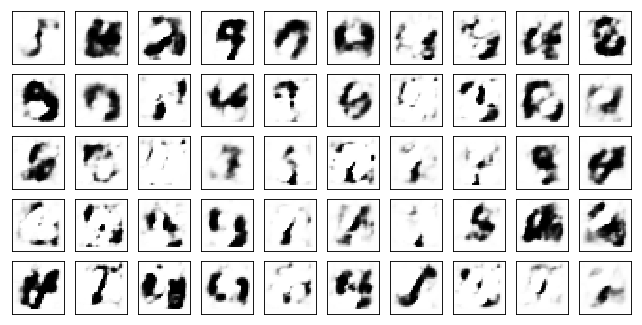

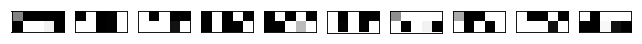

Model Adam Discr+dp:


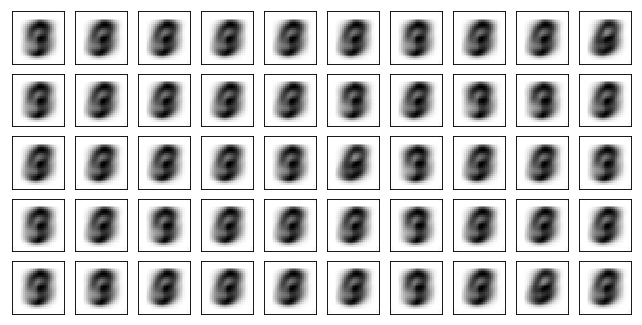

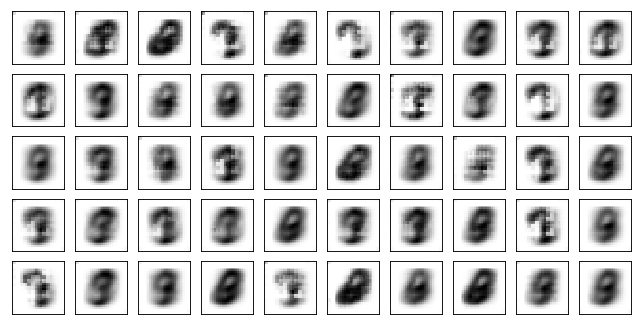

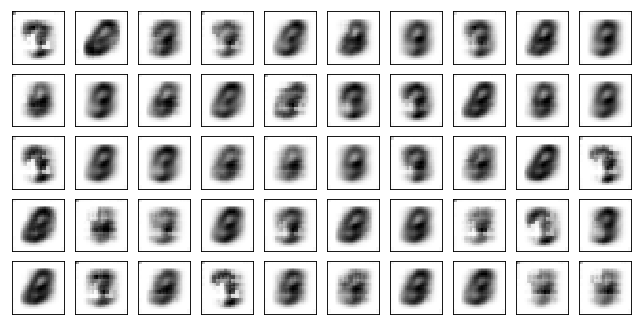

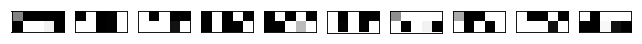

Model Adam Discr+bn+dp:


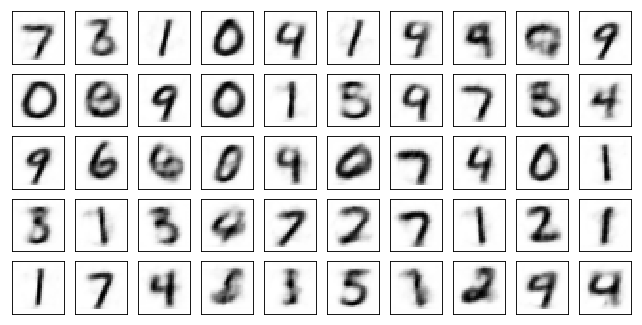

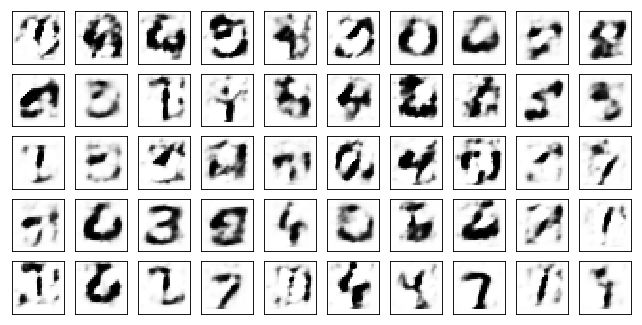

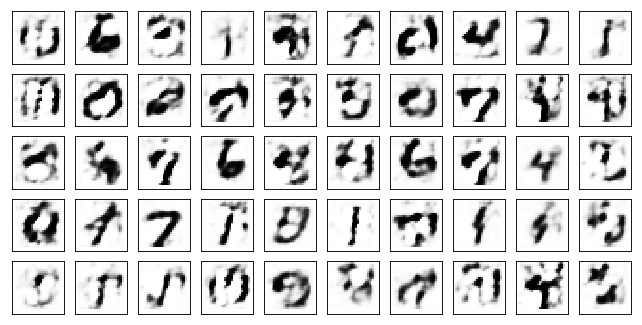

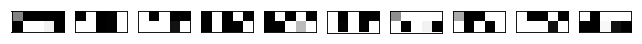

Test losses: 
Adam Discr+bn: 0.82412696 / 5.90421724 / 0.00173296 
Adam Discr+dp: 1.30836821 / 4.43397951 / 0.01935952 
Adam Discr+bn+dp: 0.73309827 / 3.88550353 / 0.02079201 

Train Epoch: 191 [0/50000 (0%)]	Losses Adam Discr+bn: AE:1.2608 D:0.0000 Adam Discr+dp: AE:1.0110 D:0.0007 Adam Discr+bn+dp: AE:0.8612 D:0.0012
Train Epoch: 191 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:1.2487 D:0.0000 Adam Discr+dp: AE:1.0593 D:0.0013 Adam Discr+bn+dp: AE:0.8550 D:0.0018
Train Epoch: 191 [50000/50000 (100%)]	Losses Adam Discr+bn: AE:1.2416 D:0.0000 Adam Discr+dp: AE:1.0136 D:0.0016 Adam Discr+bn+dp: AE:0.9260 D:0.0008
Test losses: 
Adam Discr+bn: 0.79440796 / 5.93356371 / 0.00049893 
Adam Discr+dp: 1.28734696 / 4.31459856 / 0.02244118 
Adam Discr+bn+dp: 0.72234547 / 3.93891311 / 0.02081140 

Train Epoch: 192 [0/50000 (0%)]	Losses Adam Discr+bn: AE:1.2949 D:0.0000 Adam Discr+dp: AE:0.9987 D:0.0006 Adam Discr+bn+dp: AE:0.8882 D:0.0392
Train Epoch: 192 [25000/50000 (50%)]	Losses Adam Discr+bn: 

In [16]:
for epoch in range(1, train_epoch):
    for model in models.values():
        model.train()
    train(epoch, models, train_log)
    for model in models.values():
        model.eval()
    test(models, valid_loader, epoch, 10, test_log)

Model Adam Discr+bn:


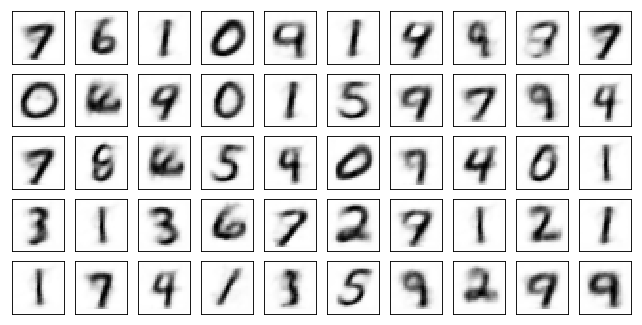

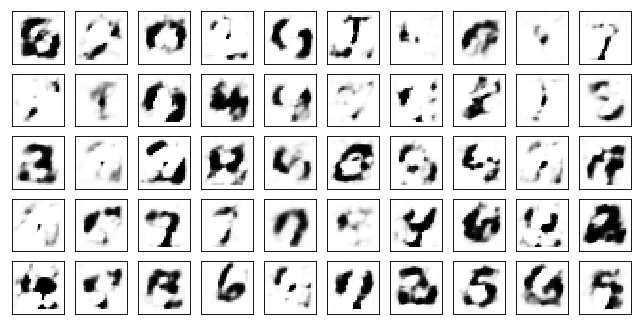

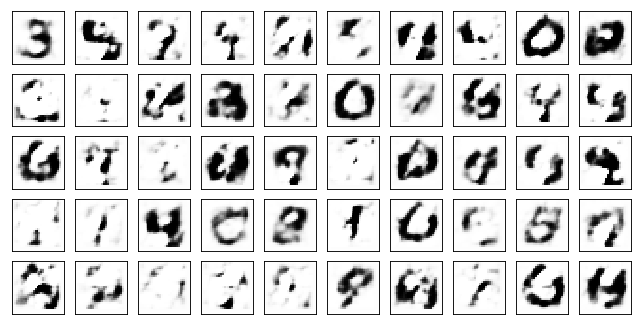

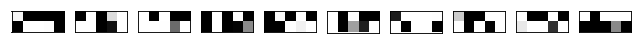

Model Adam Discr+dp:


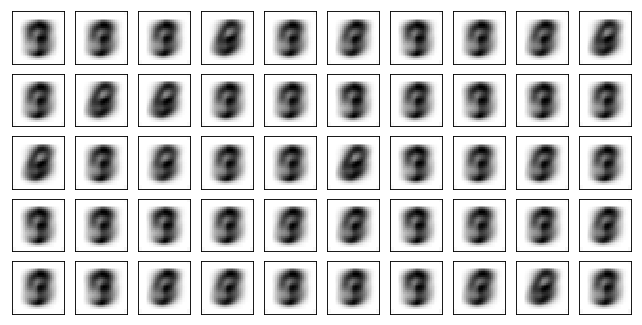

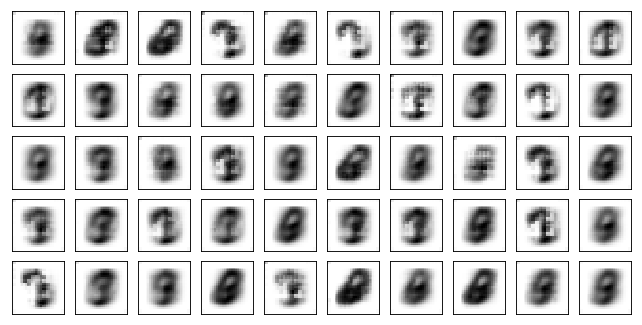

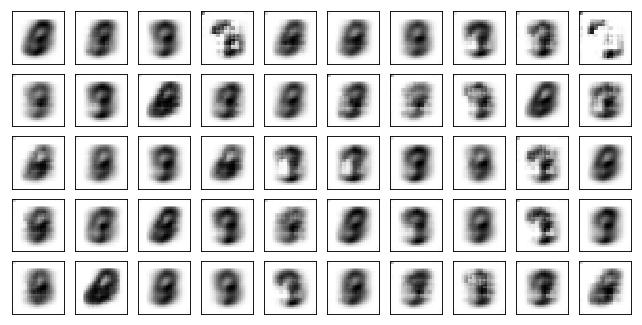

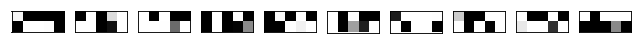

Model Adam Discr+bn+dp:


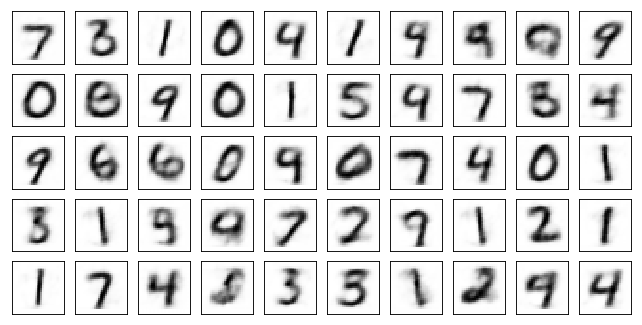

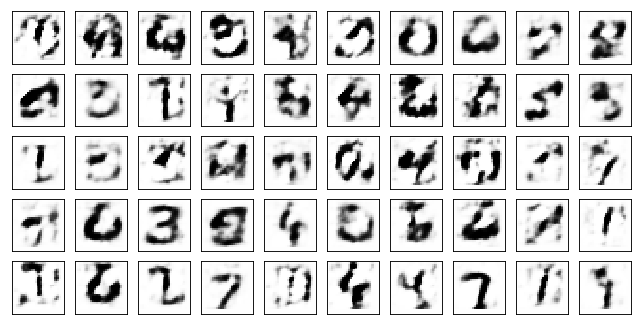

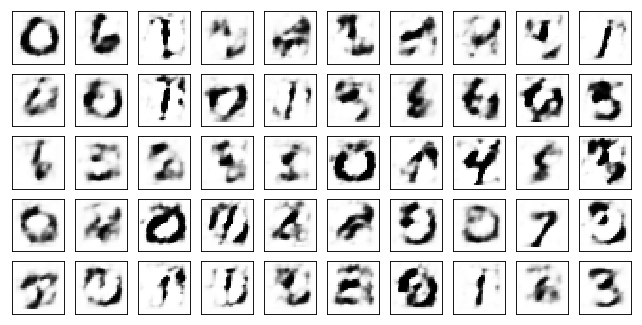

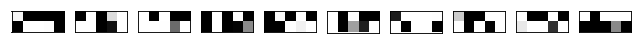

Test losses: 
Adam Discr+bn: 0.82178640 / 5.96837711 / 0.00071376 
Adam Discr+dp: 1.28673005 / 4.31194496 / 0.02160400 
Adam Discr+bn+dp: 0.72604132 / 4.02623177 / 0.02329622 



In [17]:
for model in models.values():
    model.eval()
test(models, valid_loader, 1, 1, test_log)

In [18]:
torch.save(models['Adam Discr+bn'], './adam_ds_bn_l10_1')
torch.save(models['Adam Discr+dp'], './adam_ds_dp_l10_1')
torch.save(models['Adam Discr+bn+dp'], './adam_ds_bndp_l10_1')

/home/aleksey/.conda/envs/otus-dl-engineer/lib/python3.6/site-packages/torch/serialization.py:241: UserWarning: Couldn't retrieve source code for container of type Net. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/home/aleksey/.conda/envs/otus-dl-engineer/lib/python3.6/site-packages/torch/serialization.py:241: UserWarning: Couldn't retrieve source code for container of type ConvLayer. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/home/aleksey/.conda/envs/otus-dl-engineer/lib/python3.6/site-packages/torch/serialization.py:241: UserWarning: Couldn't retrieve source code for container of type FullyConnected. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/home/aleksey/.conda/envs/otus-dl-engineer/lib/python3.6/site-packages/torch/serialization.py:241: UserWarning: Couldn't retrieve source code for container of type Deconv

### Вывод результатов

In [21]:
model = torch.load('./adam_ds_bndp_l10_1')

In [22]:
data, _ = next(iter(test_loader))
output = model(data)
to_plot = output.view(-1, 1, 28, 28).clamp(-1, 1).cpu().data.numpy()
with torch.no_grad():
    encoded = model.encode(data)
    enc_to_lot = encoded.view(-1, 1, 2, 5).clamp(-1, 1).cpu().data.numpy()
    print ('enc=', encoded.shape)


enc= torch.Size([50, 10])


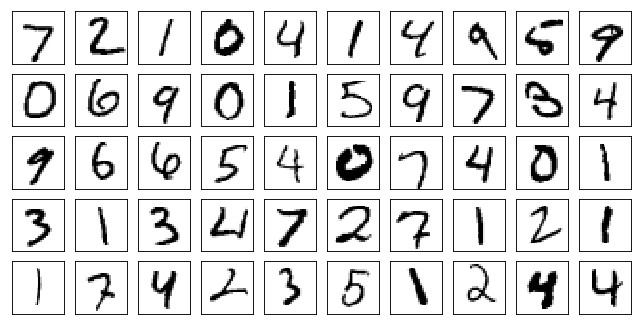

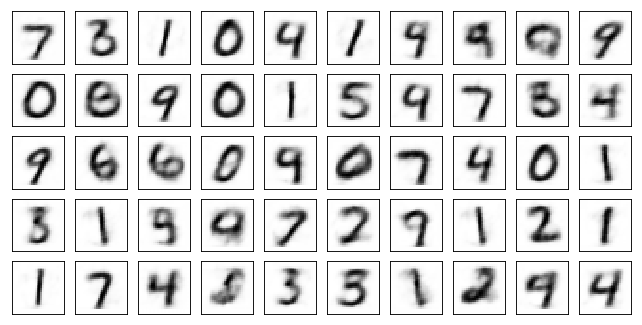

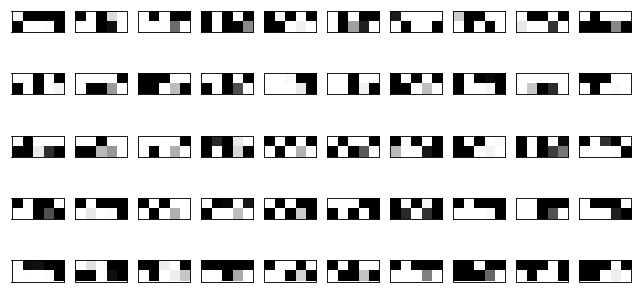

In [24]:
plot_mnist(data.data.cpu().numpy(), (5, 10))
plot_mnist(to_plot, (5, 10))
plot_latent(enc_to_lot, (5, 10))

In [25]:
def show_generated_samples():
    pred_z = torch.randn((50, 10)).to(device)
       
    pred_gen = model.decode(pred_z)
    generated = pred_gen.view(-1, 1, 28, 28).cpu().data.numpy()  
    plot_mnist(generated, (5, 10))

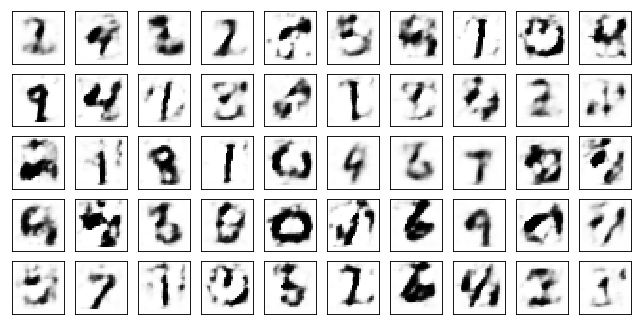

In [26]:
show_generated_samples()